# Network Topology Analysis

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import networkx as nx
import pickle
import random
import igraph as ig

### Load dataset

In [3]:
df = pd.read_csv("products_cleaned_engineered.csv")

df

,id,title,group,salesrank,review_cnt,downloads,rating,in_degree,out_degree
0,1,Patterns of Preaching: A Sermon Sampler,Book,396585.0,2,2,5.0,0,4
1,2,Candlemas: Feast of Flames,Book,168596.0,12,12,4.5,1,4
2,3,World War II Allied Fighter Planes Trading Cards,Book,1270652.0,1,1,5.0,0,5
3,4,Life Application Bible Commentary: 1 and 2 Tim...,Book,631289.0,1,1,4.0,24,5
4,5,Prayers That Avail Much for Business: Executive,Book,455160.0,0,0,0.0,53,5
...,...,...,...,...,...,...,...,...,...
259162,262104,Satchel Paige,Book,36449.0,3,3,4.5,1,4
259163,262106,Japanese for Busy People: English Teacher's Ma...,Book,588715.0,0,0,0.0,1,5
259164,262107,Halloween II,DVD,31245.0,320,320,4.0,2,4
259165,262108,Book Of Vision Quest,Book,255390.0,4,4,4.0,1,5


In [4]:
pickle_file_path = 'amazon_copurchase_graph.pickle'
with open(pickle_file_path, 'rb') as f:
    loaded_graph = pickle.load(f)

print(loaded_graph)

DiGraph with 259102 nodes and 1207337 edges


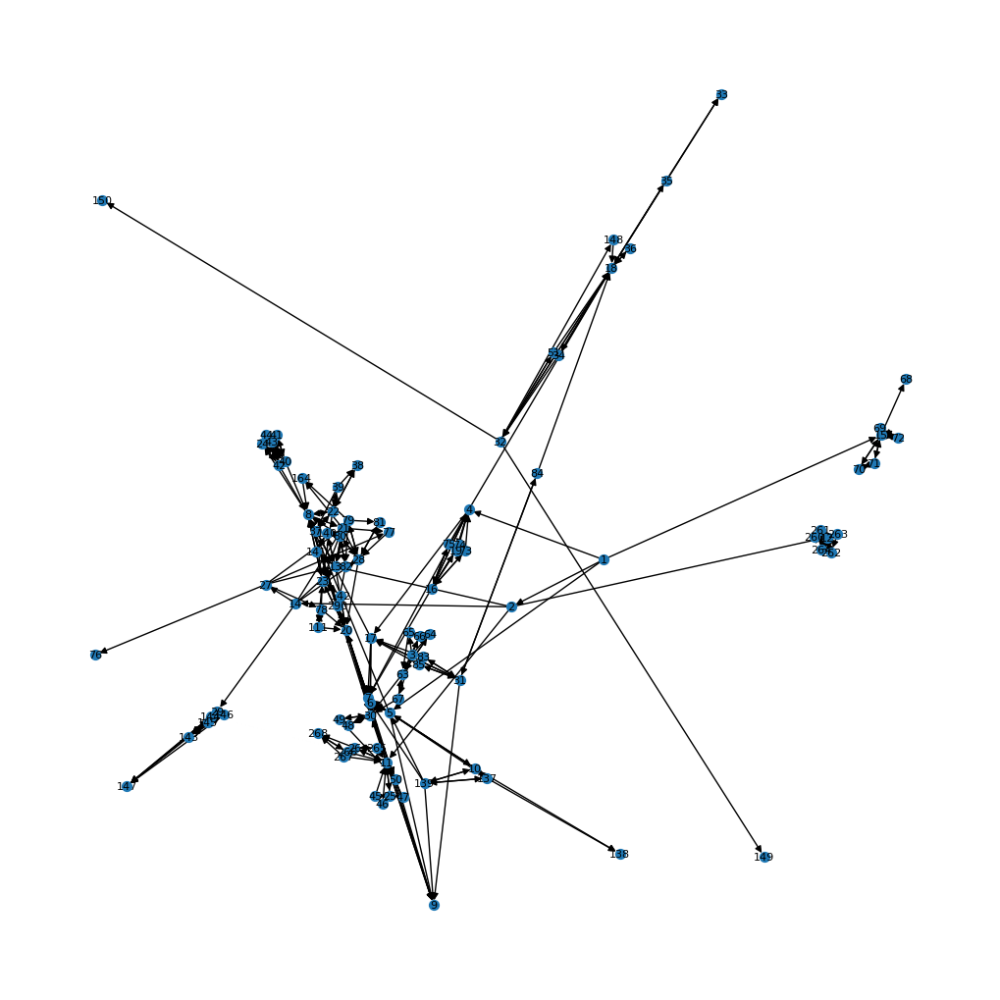

In [5]:
subgraph_nodes = list(loaded_graph.nodes())[:100]
subgraph = loaded_graph.subgraph(subgraph_nodes)

plt.figure(figsize=(10, 10))
nx.draw(subgraph, with_labels=True, node_size=50, font_size=8)
plt.show()

### Degree Distribution

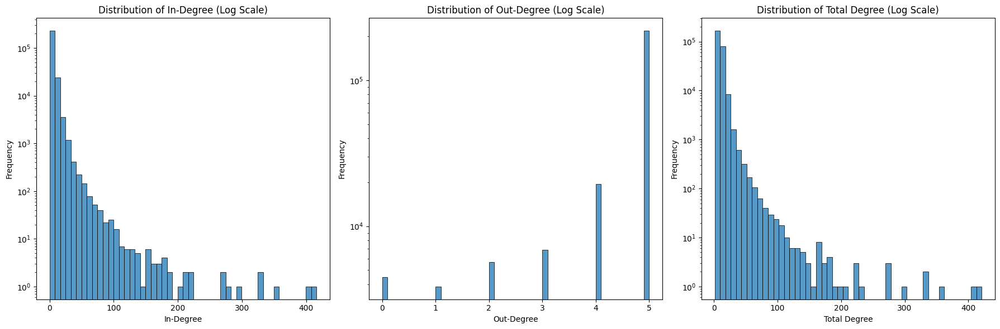

In [6]:
in_degree_counts = pd.Series([degree for node, degree in loaded_graph.in_degree()])
out_degree_counts = pd.Series([degree for node, degree in loaded_graph.out_degree()])
degree_counts = pd.Series([degree for node, degree in loaded_graph.degree()])

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns.histplot(in_degree_counts, bins=50, log=True, ax=axes[0])
axes[0].set_title('Distribution of In-Degree (Log Scale)')
axes[0].set_xlabel('In-Degree')
axes[0].set_ylabel('Frequency')

sns.histplot(out_degree_counts, bins=50, log=True, ax=axes[1])
axes[1].set_title('Distribution of Out-Degree (Log Scale)')
axes[1].set_xlabel('Out-Degree')
axes[1].set_ylabel('Frequency')

sns.histplot(degree_counts, bins=50, log=True, ax=axes[2])
axes[2].set_title('Distribution of Total Degree (Log Scale)')
axes[2].set_xlabel('Total Degree')
axes[2].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


### In-Degree Distribution
Dari grafik dikiri dapat dilihat bahwa distribusi in-degree semakin menurun, grafik ini menunjukkan bahwa sebagian besar node memiliki in-degree yang kecil, sementara hanya sedikit node yang memiliki in-degree tinggi. Dari hasil yang didapatkan banyak bahwa beberapa produk sering direkomendasikan atau dibeli bersamaan dengan banyak produk lainnya. Produk dengan in-degree tinggi kemungkinan besar adalah produk populer atau produk utama dalam kategori tertentu.

### Out-Degree Distribution

Dari grafik ditengah dapat dilihat bahwa distribusi out-degree tampak lebih spars dengan hanya beberapa nilai spesifik yang muncul dalam jumlah besar. Hasil ini menunjukkan bahwa produk yang sering muncul sebagai rekomendasi untuk produk lainnya.

### Total Degree Distribution
Dari grafik di kanan dapat dilihat bahwa pola yang didapatkan mirip dengan in-degree, ini menunjukkan bahwa hanya beberapa produk yang memiliki banyak koneksi, baik sebagai rekomendasi maupun produk yang sering dibeli bersama.



### Connected components

Number of weakly connected components: 22


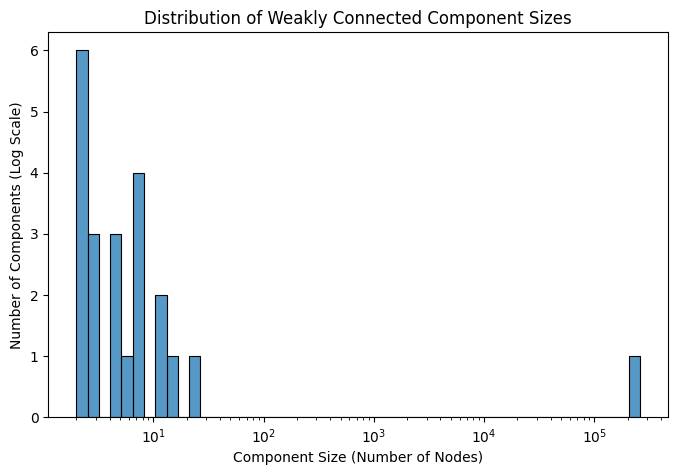

Largest weakly connected component size: 258968
Proportion of nodes in largest component: 99.95%


In [7]:
weakly_connected_components = list(nx.weakly_connected_components(loaded_graph))
num_weakly_connected_components = nx.number_weakly_connected_components(loaded_graph)
size_weakly_connected_components = [len(c) for c in weakly_connected_components]

print(f"Number of weakly connected components: {num_weakly_connected_components}")

plt.figure(figsize=(8, 5))
sns.histplot(size_weakly_connected_components, bins=50, log_scale=True, kde=False)
plt.xlabel("Component Size (Number of Nodes)")
plt.ylabel("Number of Components (Log Scale)")
plt.title("Distribution of Weakly Connected Component Sizes")
plt.show()

largest_component_size = max(size_weakly_connected_components)
print(f"Largest weakly connected component size: {largest_component_size}")
proportion_nodes_in_largest_component = largest_component_size / loaded_graph.number_of_nodes()
print(f"Proportion of nodes in largest component: {proportion_nodes_in_largest_component:.2%}")

- Ada total 22 komponen terhubung lemah (weakly connected components) dalam graph berarti sebagian besar node saling terhubung, masih ada beberapa subgraph kecil yang terisolasi dan tidak memiliki hubungan dengan komponen utama.

- Ukuran komponen terbesar adalah 258,968 node ini menunjukkan bahwa hampir seluruh produk dalam dataset Anda membentuk satu jaringan besar yang saling berhubungan dalam co-purchasing.

- Proporsi node dalam komponen terbesar adalah 99.95% Ini berarti bahwa hampir semua produk berada dalam satu komponen besar, menunjukkan adanya struktur jaringan skala besar yang terkoneksi kuat.

- Dari histogram, terlihat bahwa sebagian besar weakly connected components berukuran kurang dari 10 node. Komponen tersebut bisa terdiri dari produk yang tidak banyak dibeli bersama dengan produk lain atau kategori produk yang sangat spesifik. Alasan komponen kecil ini muncul mungkin karena produk niche atau eksklusif sehingga jarang muncul dalam pola co-purchasing. 


### Diameter, Average path length

In [ ]:
ig_graph = ig.Graph.TupleList(loaded_graph.edges(), directed=True)

diameter = ig_graph.diameter(directed=True)
avg_path_length = ig_graph.average_path_length(directed=True)

{'diameter': 88,
 'average_path_length': 20.07406801230009,
 'nodes': 259102,
 'edges': 1207337}

In [9]:
print(f"Diameter: {diameter:.2f}")
print(f"Average Path_Length: {avg_path_length}")

Diameter: 88.00
Average Path_Length: 20.07406801230009


- Diameter  88 artinya jika  memilih dua node yang paling jauh dalam graph, maka perlu melewati maksimal 88 hubungan untuk berpindah dari satu node ke node lainnya. Diameter yang besar berarti sebuah produk memiliki hubungan tidak langsung yang sangat panjang sebelum mencapai produk lainnya

- Average Path lenght 20.07 berarti bahwa, rata-rata, untuk mencapai satu produk dari produk lain dalam jaringan, diperlukan sekitar 20 hubungan pembelian bersama. Hasil ini menunjukkan bahwa hubungan antara produk tetap relatif efisien dalam menyebarkan informasi atau koneksi.

### Clustering Coefficient 

In [20]:
clustering_coeff = nx.clustering(loaded_graph)
print("Clustering coefficient for each node:")
for node, centrality in clustering_coeff.items():
    print(f"Node {node}: Clustering Coefficient = {centrality:.4f}")

Clustering coefficient for each node:
Node 1: Clustering Coefficient = 0.0000
Node 2: Clustering Coefficient = 0.0500
Node 4: Clustering Coefficient = 0.1052
Node 5: Clustering Coefficient = 0.0358
Node 15: Clustering Coefficient = 0.0794
Node 11: Clustering Coefficient = 0.0391
Node 12: Clustering Coefficient = 0.0567
Node 13: Clustering Coefficient = 0.0597
Node 14: Clustering Coefficient = 0.0556
Node 3: Clustering Coefficient = 0.4500
Node 63: Clustering Coefficient = 0.0391
Node 64: Clustering Coefficient = 0.2326
Node 65: Clustering Coefficient = 0.1908
Node 66: Clustering Coefficient = 0.3065
Node 67: Clustering Coefficient = 0.0757
Node 7: Clustering Coefficient = 0.0392
Node 16: Clustering Coefficient = 0.5098
Node 17: Clustering Coefficient = 0.0725
Node 18: Clustering Coefficient = 0.0069
Node 19: Clustering Coefficient = 0.2171
Node 6: Clustering Coefficient = 0.0086
Node 8: Clustering Coefficient = 0.0024
Node 9: Clustering Coefficient = 0.0500
Node 10: Clustering Coeffici

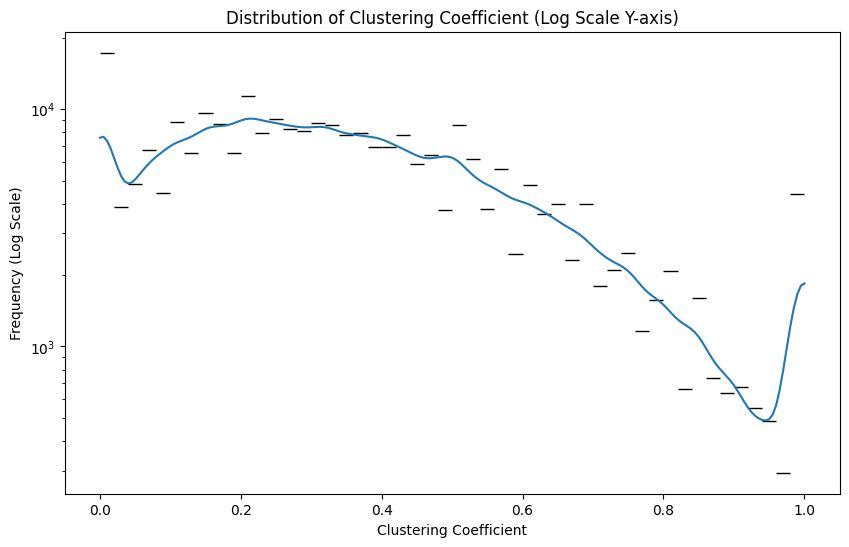

In [21]:
clustering_coeff_values = list(clustering_coeff.values())

plt.figure(figsize=(10, 6))
sns.histplot(clustering_coeff_values, bins=50, kde=True, log_scale=(False, True)) 
plt.title('Distribution of Clustering Coefficient (Log Scale Y-axis)')
plt.xlabel('Clustering Coefficient')
plt.ylabel('Frequency (Log Scale)')
plt.show()

Dari hasil grafik diatas dapat dilihat bahwa frekuensi tertinggi berada di rentang 0.1 - 0.4, ini berarti bahwa banyaknya node dalam graph memiliki hubungan clustering yang rendah hingga sedang ini berarti bahwa mereka terhubung ke beberapa tetangga tetapi tidak semuanya saling terhubung.. Selanjutnya setelah nilai 0.4 distribusi semakin menurun yang menunjukkan bahwa semakin sedikit node yang memiliki clustering coefficient tinggi. Selanjutnya dapat dilihat bahwa terdapat beberapa node dengan coefficient 1 mungkin terdapat banyak kelompok kecil  seperti produk yang selalu dibeli bersama dalam bundel.

### Average Clustering coefficient

In [22]:
avg_clustering_coeff = nx.average_clustering(loaded_graph)
print(f"Average clustering coefficient: {avg_clustering_coeff:.4f}")

Average clustering coefficient: 0.3464


Dari hasil yang didapatkan nilai Average clustering coefficient adalah 0,3464 yang berarti 34,64% dari tetangga sebuah node terhubung satu sama lain. Nilai tersebut menunjukkan bahwa jaringan memiliki tingkat pengelompokan yang moderat.

# Centrality Measures

### Degree Centrality

In [8]:
degree_centrality = nx.degree_centrality(loaded_graph)
top_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:5]
print("\nTop 5 nodes by Degree Centrality:")
for node, centrality in top_degree_centrality:
    print(f"Node {node}: Centrality {centrality:.4f}")


Top 5 nodes by Degree Centrality:
Node 14949: Centrality 0.0016
Node 4429: Centrality 0.0016
Node 33: Centrality 0.0014
Node 10519: Centrality 0.0013
Node 12771: Centrality 0.0013


In [10]:
degree_nodes = [14949, 4429, 33, 10519, 12771]
top_degree_centrality_df = df[df['id'].isin(degree_nodes)]

top_degree_centrality_df

,id,title,group,salesrank,review_cnt,downloads,rating,in_degree,out_degree
32,33,"Double Jeopardy (T*Witches, 6)",Book,97166.0,4,4,5.0,352,5
4389,4429,"Harley-Davidson Panheads, 1948-1965/M418",Book,147799.0,3,3,4.5,400,5
10421,10519,Pilgrim,Music,141107.0,7,7,4.5,331,5
12650,12771,Jorge Negrete,Book,305561.0,1,1,4.0,327,4
14805,14949,Fodor's Australia 2000,Book,793062.0,1,1,5.0,416,5


In [11]:
top_degree_centrality_df[['id', 'title', 'group', 'downloads', 'rating', 'in_degree', 'out_degree']]

,id,title,group,downloads,rating,in_degree,out_degree
32,33,"Double Jeopardy (T*Witches, 6)",Book,4,5.0,352,5
4389,4429,"Harley-Davidson Panheads, 1948-1965/M418",Book,3,4.5,400,5
10421,10519,Pilgrim,Music,7,4.5,331,5
12650,12771,Jorge Negrete,Book,1,4.0,327,4
14805,14949,Fodor's Australia 2000,Book,1,5.0,416,5


Dari hasil yang didapatkan nilai tersebut sangat kecil berarti node tersebut mempunyai beberapa koneksi relatif terhadap jumlah total node ini menandakan bahwa graph tersebut sangat besar dan sparsely connected. Selanjutnya dengan nilai degree centrality tertinggi adalah 0.0016 maka bahwa node yang terhubung hanya terhubung ke sebagian kecil dari total graf.

### PageRank

In [12]:
pagerank_centrality = nx.pagerank(loaded_graph)
top_pagerank_centrality = sorted(pagerank_centrality.items(), key=lambda x: x[1], reverse=True)[:5]

print("\nTop 5 nodes by PageRank Centrality:")
for node, centrality in top_pagerank_centrality:
    print(f"Node {node}: Centrality {centrality:.4f}")


Top 5 nodes by PageRank Centrality:
Node 4429: Centrality 0.0005
Node 33: Centrality 0.0005
Node 8: Centrality 0.0004
Node 93: Centrality 0.0003
Node 481: Centrality 0.0003


Node 4429 dan Node 33 mempunyai skor PageRank tertinggi, Ini berarti bahwa node tersebut mempunyai link dari node yang penting atau well-connected nodes. Dengan Degree centrality, node diukur berdasarkan jumlah connections. Sedangkan PageRank centrality nodes diukur berdasarkan kualitas link yang masuk. node dengan banyak koneksi mungkin tidak selalu memiliki PageRank yang tinggi jika koneksinya berasal dari node dengan peringkat rendah.

In [13]:
pagerank_nodes = [4429, 33, 8, 93, 481]
top_pagerank_centrality_df = df[df['id'].isin(pagerank_nodes)]

top_pagerank_centrality_df

,id,title,group,salesrank,review_cnt,downloads,rating,in_degree,out_degree
7,8,Losing Matt Shepard,Book,277409.0,15,15,4.5,293,5
32,33,"Double Jeopardy (T*Witches, 6)",Book,97166.0,4,4,5.0,352,5
92,93,BizPricer¿ Business Valuation Manual w/Software,Book,1485593.0,0,0,0.0,216,5
477,481,A Major Case: A Novel by Pete Deer,Book,2860756.0,14,14,4.5,273,5
4389,4429,"Harley-Davidson Panheads, 1948-1965/M418",Book,147799.0,3,3,4.5,400,5


In [14]:
top_pagerank_centrality_df[['id', 'title', 'group', 'downloads', 'rating', 'in_degree', 'out_degree']]

,id,title,group,downloads,rating,in_degree,out_degree
7,8,Losing Matt Shepard,Book,15,4.5,293,5
32,33,"Double Jeopardy (T*Witches, 6)",Book,4,5.0,352,5
92,93,BizPricer¿ Business Valuation Manual w/Software,Book,0,0.0,216,5
477,481,A Major Case: A Novel by Pete Deer,Book,14,4.5,273,5
4389,4429,"Harley-Davidson Panheads, 1948-1965/M418",Book,3,4.5,400,5


### Betweenness Centrality (sample for large graphs)

In [15]:
sorted_nodes = sorted(pagerank_centrality, key=pagerank_centrality.get, reverse=True)[:1000] 
subgraph = loaded_graph.subgraph(sorted_nodes).copy()

betweenness_centrality_page = nx.betweenness_centrality(subgraph)
top_betweenness_centrality = sorted(betweenness_centrality_page.items(), key=lambda x: x[1], reverse=True)[:5]

print("\nTop 5 nodes by Betweenness Centrality based on top 1000 nodes Page Rank : ")
for node, centrality in top_betweenness_centrality:
    print(f"Node {node}: Centrality {centrality:.4f}")



Top 5 nodes by Betweenness Centrality based on top 1000 nodes Page Rank : 
Node 481: Centrality 0.0081
Node 2501: Centrality 0.0062
Node 151: Centrality 0.0057
Node 8458: Centrality 0.0056
Node 8: Centrality 0.0051


In [16]:
pagerank_nodes = [481, 2501, 151, 8458, 8]
betweenness_centrality_page_df = df[df['id'].isin(pagerank_nodes)]

betweenness_centrality_page_df

,id,title,group,salesrank,review_cnt,downloads,rating,in_degree,out_degree
7,8,Losing Matt Shepard,Book,277409.0,15,15,4.5,293,5
150,151,Laurel & Hardy - Flying Deuces/Utopia,DVD,44671.0,13,13,3.0,85,5
477,481,A Major Case: A Novel by Pete Deer,Book,2860756.0,14,14,4.5,273,5
2480,2501,The Narcissistic Family : Diagnosis and Treatment,Book,9727.0,19,19,5.0,191,5
8380,8458,Making Their Own Way: Narratives for Transform...,Book,145243.0,1,1,5.0,106,5


In [17]:
betweenness_centrality_page_df[['id', 'title', 'group', 'downloads', 'rating', 'in_degree', 'out_degree']]

,id,title,group,downloads,rating,in_degree,out_degree
7,8,Losing Matt Shepard,Book,15,4.5,293,5
150,151,Laurel & Hardy - Flying Deuces/Utopia,DVD,13,3.0,85,5
477,481,A Major Case: A Novel by Pete Deer,Book,14,4.5,273,5
2480,2501,The Narcissistic Family : Diagnosis and Treatment,Book,19,5.0,191,5
8380,8458,Making Their Own Way: Narratives for Transform...,Book,1,5.0,106,5


Pada kasus ini dipilih 1000 node dengan PageRank tertinggi, dimana kasus ini akan fokus pada bagian graph yang memiliki pengaruh signifikan dalam struktur jaringan.

Dari hasil yang didapatkan Node 481 memiliki betweenness centrality tertinggi (0.0081), yang menunjukkan bahwa node ini sering menjadi jembatan antar kelompok produk yang sering dibeli. tetapi nilai tersebut masih kecil, sehingga ini mengindikasikan bahwa memiliki banyak jalur alternatif.

In [18]:
betweenness_centrality = nx.betweenness_centrality(loaded_graph, k=1000)
top_betweenness_centrality_5 = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:5]

print("\nTop 5 nodes by Betweenness Centrality approximate 1000: ")
for node, centrality in top_betweenness_centrality_5:
    print(f"Node {node}: Centrality {centrality:.4f}")



Top 5 nodes by Betweenness Centrality approximate 1000: 
Node 2501: Centrality 0.0243
Node 7629: Centrality 0.0235
Node 13222: Centrality 0.0217
Node 6935: Centrality 0.0216
Node 10072: Centrality 0.0175


In [22]:
pagerank_nodes = [2501, 7629, 13222, 6935, 10072]
top_betweenness_centrality_approximate_df = df[df['id'].isin(pagerank_nodes)]

top_betweenness_centrality_approximate_df

,id,title,group,salesrank,review_cnt,downloads,rating,in_degree,out_degree
2480,2501,The Narcissistic Family : Diagnosis and Treatment,Book,9727.0,19,19,5.0,191,5
6865,6935,Where There Is No Vet,Book,672391.0,0,0,0.0,9,5
7556,7629,More Than You Think You Are,Music,766.0,382,382,4.5,26,5
9977,10072,The Yellow Fountain (La Fuente Amarilla),DVD,39867.0,4,4,4.0,23,5
13097,13222,"If I Were a Man, I'd Marry Me",Book,807679.0,8,8,5.0,46,5


In [23]:
top_betweenness_centrality_approximate_df[['id', 'title', 'group', 'downloads', 'rating', 'in_degree', 'out_degree']]

,id,title,group,downloads,rating,in_degree,out_degree
2480,2501,The Narcissistic Family : Diagnosis and Treatment,Book,19,5.0,191,5
6865,6935,Where There Is No Vet,Book,0,0.0,9,5
7556,7629,More Than You Think You Are,Music,382,4.5,26,5
9977,10072,The Yellow Fountain (La Fuente Amarilla),DVD,4,4.0,23,5
13097,13222,"If I Were a Man, I'd Marry Me",Book,8,5.0,46,5


Pada kasus ini dilakukan pendekatan estimasi untuk menghitung Betweenness Centrality dalam graph transaksi Amazon. Pendekatan ini menggunakan parameter k=1000, yang berarti hanya 1000 node yang dipilih secara acak untuk mempercepat perhitungan, dari hasil yang didapatkan node 7629 merupakan produk yang sering menjadi perantara dalam jalur transaksi, dan menjadi penghubung utama dalam transaksi co-purchasing.

In [ ]:
nx_to_igraph = ig.Graph.TupleList(loaded_graph.edges(), directed=loaded_graph.is_directed())

betweenness_centrality_igraph = nx_to_igraph.betweenness()

betweenness_centrality_dict = {node: betweenness_centrality_igraph[idx] for idx, node in enumerate(loaded_graph.nodes())}

top_betweenness_centrality_5_igraph = sorted(betweenness_centrality_dict.items(), key=lambda x: x[1], reverse=True)[:5]

print("\nTop 5 nodes by Betweenness Centrality (using igraph): ")
for node, centrality in top_betweenness_centrality_5_igraph:
    print(f"Node {node}: Centrality {centrality:.4f}")


Top 5 nodes by Betweenness Centrality (using igraph): 
Node 3658: Centrality 1606678675.9249
Node 2693: Centrality 1577508568.6957
Node 7851: Centrality 1433519828.2663
Node 9845: Centrality 1394511688.8611
Node 12959: Centrality 1168736499.7694


In [24]:
pagerank_nodes = [3658, 2693, 7851, 9845, 12959]
betweenness_centrality_df = df[df['id'].isin(pagerank_nodes)]

betweenness_centrality_df

,id,title,group,salesrank,review_cnt,downloads,rating,in_degree,out_degree
2672,2693,Storm,Music,19093.0,15,15,4.5,10,5
3627,3658,Expressionism in Philosophy: Spinoza,Book,312858.0,2,2,4.5,4,5
7777,7851,Islam: Religion of Life,Book,60074.0,0,0,0.0,1,5
9753,9845,Good News for Women: A Biblical Picture of Gen...,Book,467310.0,11,11,4.0,2,5
12837,12959,StarFox Adventures: Dinosaur Planet: Prima's O...,Book,372944.0,1,1,5.0,2,5


In [25]:
betweenness_centrality_df[['id', 'title', 'group', 'downloads', 'rating', 'in_degree', 'out_degree']]

,id,title,group,downloads,rating,in_degree,out_degree
2672,2693,Storm,Music,15,4.5,10,5
3627,3658,Expressionism in Philosophy: Spinoza,Book,2,4.5,4,5
7777,7851,Islam: Religion of Life,Book,0,0.0,1,5
9753,9845,Good News for Women: A Biblical Picture of Gen...,Book,11,4.0,2,5
12837,12959,StarFox Adventures: Dinosaur Planet: Prima's O...,Book,1,5.0,2,5


Dikarenakan graphnya sangat besar maka digunakan igraph dikarenakan lebih efisien dibandingkan NetworkX dalam perhitungan betweenness centrality. Dari hasil yang didapatkan terlihat bahwa Node 3658 memiliki betweenness centrality tertinggi, menunjukkan bahwa node ini sering berada di jalur terpendek antara node lain dalam directed graph dan menjadi penghubung utama dalam transaksi co-purchasing.

### Closeness Centrality (sample for large graphs, and handling disconnected components)

In [31]:
nx_graph = loaded_graph
ig_graph = ig.Graph.TupleList(nx_graph.edges(), directed=nx_graph.is_directed())

harmonic_closeness = ig_graph.harmonic_centrality()
node_list = list(nx_graph.nodes())
harmonic_closeness_dict = {node_list[i]: harmonic_closeness[i] for i in range(len(node_list))}

top_5_harmonic = sorted(harmonic_closeness_dict.items(), key=lambda x: x[1], reverse=True)[:5]

print("\nTop 5 nodes by Harmonic Closeness Centrality (iGraph -> NetworkX):")
for node, centrality in top_5_harmonic:
    print(f"Node {node}: Centrality {centrality:.4f}")


Top 5 nodes by Harmonic Closeness Centrality (iGraph -> NetworkX):
Node 6562: Centrality 0.2029
Node 164: Centrality 0.1978
Node 277: Centrality 0.1965
Node 431: Centrality 0.1939
Node 2693: Centrality 0.1935


In [26]:
pagerank_nodes = [6562, 164, 277, 431, 2693]
harmonic_closeness_df = df[df['id'].isin(pagerank_nodes)]

harmonic_closeness_df

,id,title,group,salesrank,review_cnt,downloads,rating,in_degree,out_degree
163,164,What's Really Wrong With You: A Revolutionary ...,Book,224993.0,12,12,3.5,21,5
276,277,The Complete Idiot's Guide to 401(k) Plans (2n...,Book,216529.0,2,2,5.0,1,5
427,431,Hungarian Vizsla (World of Dogs),Book,721894.0,2,2,4.5,1,5
2672,2693,Storm,Music,19093.0,15,15,4.5,10,5
6493,6562,Roman Transliteration of the Holy Quran,Book,1035917.0,0,0,0.0,3,5


In [27]:
harmonic_closeness_df[['id', 'title', 'group', 'downloads', 'rating', 'in_degree', 'out_degree']]

,id,title,group,downloads,rating,in_degree,out_degree
163,164,What's Really Wrong With You: A Revolutionary ...,Book,12,3.5,21,5
276,277,The Complete Idiot's Guide to 401(k) Plans (2n...,Book,2,5.0,1,5
427,431,Hungarian Vizsla (World of Dogs),Book,2,4.5,1,5
2672,2693,Storm,Music,15,4.5,10,5
6493,6562,Roman Transliteration of the Holy Quran,Book,0,0.0,3,5


Pada kasus ini digunakan harmonic closeness karena bekerja lebih bagus pada directed graph dan weakly connected components dibandingkan closeness centrality biasanya, karena closeness centrality hanya bisa hitung untuk node yang memiliki jalur ke semua node lainnya (graph strongly connected). Dari hasil yang didapatkan node 6562 memiliki harmonic closeness centrality tertinggi (0.2029), yang berarti node ini memiliki jalur pendek ke banyak node lain dalam jaringan daan artinya produk ini lebih dekat ke banyak produk lain dalam struktur transaksi. 

### Create and Export Graph

In [35]:
df = pd.read_csv("products_cleaned_engineered.csv")

centrality_df = pd.DataFrame({
    'id': list(pagerank_centrality.keys()),
    'pagerank_centrality': list(pagerank_centrality.values()),
    'betweenness_centrality': list(betweenness_centrality_dict.values()),
    'harmonic_closeness_centrality': list(harmonic_closeness_dict.values()),
    'degree_centrality': list(degree_centrality.values())

})

print(centrality_df)

df = df.merge(centrality_df, on='id', how='left')


df.to_csv('products_cleaned_engineered_centrality.csv', index=False)

            id  pagerank_centrality  betweenness_centrality  \
0            1         6.210154e-07            0.000000e+00   
1            2         7.560926e-07            3.156367e+04   
2            4         1.344647e-05            6.528478e+06   
3            5         8.238891e-05            1.544240e+07   
4           15         1.545618e-05            1.521861e+07   
...        ...                  ...                     ...   
259097  262094         8.406163e-07            2.384215e+05   
259098  262108         1.649275e-06            6.666667e-01   
259099  262107         1.980415e-06            6.000000e-01   
259100  262106         1.426196e-06            8.405184e+02   
259101  262109         8.406163e-07            5.833333e-01   

        harmonic_closeness_centrality  degree_centrality  
0                            0.144256           0.000015  
1                            0.144487           0.000019  
2                            0.155884           0.000112  
3      

In [ ]:
df_copurchase = pd.read_csv('copurchase_cleaned.csv')

G = nx.from_pandas_edgelist(df_copurchase, 'Source', 'Target', create_using=nx.DiGraph())

node_attrs = df.set_index('id').to_dict('index')
nx.set_node_attributes(G, node_attrs)

print(f"Graph has {G.number_of_nodes()} nodes and {G.number_of_edges()} edges")

Graph has 259102 nodes and 1207337 edges


In [37]:
import pickle

pickle_file_path = 'amazon_copurchase_graph.pickle'
with open(pickle_file_path, 'wb') as f:
    pickle.dump(G, f)

In [38]:
graphml_file_path = 'amazon_copurchase_graph.graphml'

nx.write_graphml(G, graphml_file_path)

In [1]:
%env NX_CUGRAPH_AUTOCONFIG=True

env: NX_CUGRAPH_AUTOCONFIG=True


In [2]:
!pip install igraph leidenalg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 29.3 MB/s eta 0:00:00


In [3]:
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import pickle
import igraph as ig
import leidenalg as la
import seaborn as sns

In [4]:
def load_community_result(*args):
    """Load community results from pickle files."""
    communities = []
    for file in args:
        with open(file, 'rb') as f:
            communities.append(pickle.load(f))
    return communities

def calculate_community_quality(G, community):
    """Calculates quality metrics for a given community structure in a graph.

    This function computes three common metrics to assess the quality of a
    community partition in a graph: modularity, coverage, and performance.

    Modularity measures the strength of division of a network into communities.
    It quantifies the difference between the fraction of edges within communities
    and the expected fraction if edges were distributed at random. Higher
    modularity values (closer to 1) generally indicate better community structure.

    Coverage is the fraction of edges that fall within communities. It measures
    how much of the network's connectivity is captured by the identified
    communities. Higher coverage is generally desirable.

    Performance is a metric that combines coverage and the fraction of vertices
    in communities. It is designed to be less sensitive to the number of
    communities and the size of the graph than coverage alone. Higher performance
    values are generally better.

    Args:
        G (nx.Graph): The NetworkX graph for which to calculate community quality.
        community (list of set): A list of sets, where each set represents a
            community and contains the nodes belonging to that community.
            For example: `[{1, 2, 3}, {4, 5}]` represents two communities.

    Returns:
        dict: A dictionary containing the calculated community quality metrics.
              The dictionary has the following keys:
                - 'modularity' (float): The modularity score of the community structure.
                - 'coverage' (float): The coverage score of the community structure.
                - 'performance' (float): The performance score of the community structure.

    Examples:
        >>> import networkx as nx
        >>> G = nx.karate_club_graph()
        >>> community = [{0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 17, 19, 21}, {9, 14, 15, 16, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]
        >>> quality_metrics = calculate_community_quality(G, community)
        >>> print(quality_metrics)
        {'modularity': 0.3792373075876584, 'coverage': 0.77875, 'performance': 0.6007444168734458}
    """
    modularity = nx.community.modularity(G, community)
    community_quality_result = nx.community.partition_quality(G, community)
    return {
        'modularity': modularity,
        'coverage': community_quality_result[0],
        'performance': community_quality_result[1],
    }

def analyze_community_sizes(communities):
    """
    Analyze community sizes when communities are provided as a list of sets
    """
    # Calculate size of each community
    sizes = [len(community) for community in communities]

    return {
        'total_communities': len(communities),
        'largest_community': max(sizes),
        'smallest_community': min(sizes),
        'average_size': np.mean(sizes),
        'median_size': np.median(sizes),
        'size_distribution': sizes
    }

def visualize_community_sample(G, communities, method_name, max_nodes=500):
    """
    Visualize sample of largest and medium communities with directed edges and nodes colored by group
    communities: list of sets where each set contains nodes of one community
    """
    sorted_communities = sorted(communities, key=len, reverse=True)

    # Get top 3 largest communities
    largest_communities = sorted_communities[:3]

    # Get 3 communities from the middle
    middle_idx = len(sorted_communities) // 2
    middle_communities = sorted_communities[middle_idx-1:middle_idx+2]

    # Define color mapping for different product groups
    group_colors = {
        'Book': 'royalblue',
        'Music': 'limegreen',
        'DVD': 'crimson',
        'Video': 'gold',
        'Software': 'purple',
        'CE': 'orange',
        'Baby Product': 'pink',
        'Toy': 'cyan',
        'Video Games': 'darkgreen'
    }
    # Default color for unknown groups
    default_color = 'lightgray'

    plt.figure(figsize=(18, 10), facecolor='white')

    # Function to draw a single community subplot
    def draw_community(community, subplot_idx, label):
        plt.subplot(2, 3, subplot_idx)

        # Get nodes in this community
        nodes = list(community)

        # If too many nodes, sample them
        if len(nodes) > max_nodes:
            nodes = np.random.choice(nodes, max_nodes, replace=False)

        # Create subgraph
        subgraph = G.subgraph(nodes)
        pos = nx.spring_layout(subgraph, seed=42)

        # Get node colors based on group attribute
        node_colors = []
        for node in subgraph.nodes():
            try:
                # Try to get group attribute, use default color if not found
                group = G.nodes[node].get('group', None)
                node_colors.append(group_colors.get(group, default_color))
            except:
                node_colors.append(default_color)

        # Draw nodes with group colors
        nx.draw_networkx_nodes(subgraph, pos, node_size=30, node_color=node_colors)

        # Draw directed edges with arrows
        nx.draw_networkx_edges(subgraph, pos, alpha=0.4, width=0.5,
                              arrows=True, arrowsize=10, arrowstyle='->')

        comm_id = list(communities).index(community)
        plt.title(f"{method_name} - {label} Community {comm_id} (n={len(community)})")
        plt.axis('off')

        # Add legend for group colors
        unique_groups = set()
        for node in subgraph.nodes():
            try:
                group = G.nodes[node].get('group', None)
                if group:
                    unique_groups.add(group)
            except:
                pass

        # Create legend with only groups present in this community
        legend_elements = [plt.Line2D([0], [0], marker='o', color='w',
                           markerfacecolor=group_colors.get(group, default_color),
                           label=group, markersize=8)
                           for group in unique_groups]

        if legend_elements:
            plt.legend(handles=legend_elements, loc='upper right', fontsize='x-small')

    # Draw top 3 communities
    for i, community in enumerate(largest_communities):
        draw_community(community, i+1, "Largest")

    # Draw middle 3 communities
    for i, community in enumerate(middle_communities):
        draw_community(community, i+4, "Medium")

    plt.tight_layout()
    plt.show()

In [5]:
df_products = pd.read_csv('products_cleaned_engineered.csv')
df_copurchases = pd.read_csv('copurchase_cleaned.csv')

pickle_file_path = 'amazon_copurchase_graph.pickle'
with open(pickle_file_path, 'rb') as f:
    G = pickle.load(f)
print(f"Loaded graph with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges")

node_num, edge_num = G.number_of_nodes(), G.number_of_edges()

SEED = 28

Loaded graph with 259102 nodes and 1207337 edges


### Notes for algorithm used
* The only direct graph community detection are Louvain, LPA, Greedy, Fluid, Leiden, and Infomap. The rest are approximated by converting the graph into undirected first
* Girvan-Newman, Kernighan-Lin, K-clique, Lukes, etc. aren't used because they are not scalable to large graphs (would take forever)

In [ ]:
louvain_communities = nx.community.louvain_communities(G, seed=SEED)
louvain_partition = nx.community.louvain_partitions(G, seed=SEED)
print(f"Found {len(louvain_communities)} communities using Louvain")

# with open('louvain_communities.pickle', 'wb') as f:
#     pickle.dump(louvain_communities, f)

Found 218 communities using Louvain


In [ ]:
lpa_communities_generator = nx.community.fast_label_propagation_communities(G, seed=SEED)
lpa_communities = list(lpa_communities_generator)
print(f"Found {len(lpa_communities)} communities using LPA")

with open('lpa_communities.pickle', 'wb') as f:
    pickle.dump(lpa_communities, f)

Found 32680 communities using LPA


In [ ]:
# NOTE: Potential for hyperparameter tuning. Params to be tuned:
# - Resolution parameter (resolution=1.0). Try to lower this for larger community (should do it since our graph is very large)
# - best_n (default = None)
# - Curoff (default = 1)
greedy_modularity = nx.community.greedy_modularity_communities(G)
print(f"Found {len(greedy_modularity)} communities using Greedy Modularity")

with open('greedy_modularity.pickle', 'wb') as f:
    pickle.dump(greedy_modularity, f)

Found 1168 communities using Greedy Modularity


In [ ]:
G_undirected = G.to_undirected()

In [ ]:
largest_connected_component_nodes = max(nx.connected_components(G_undirected), key=len)
largest_connected_component = G_undirected.subgraph(largest_connected_component_nodes)

fluid_community = nx.community.asyn_fluidc(largest_connected_component, k=500, seed=SEED)
fluid_community = list(fluid_community)

all_nodes = set(G_undirected.nodes())
lcc_nodes = set(largest_connected_component_nodes)
outside_community_nodes = list(all_nodes - lcc_nodes)

fluid_community.append(set(outside_community_nodes))

with open('fluid_communities.pickle', 'wb') as f:
    pickle.dump(fluid_community, f)

/usr/local/lib/python3.10/dist-packages/networkx/utils/backends.py:1777: UserWarning: Note: conversions to backend graphs are saved to cache (`G.__networkx_cache__` on the original graph) by default.

This warning means the cached graph is being used for the 'cugraph' backend in the call to connected_components.

For the cache to be consistent (i.e., correct), the input graph must not have been manually mutated since the cached graph was created. Examples of manually mutating the graph data structures resulting in an inconsistent cache include:

    >>> G[u][v][key] = val

and

    >>> for u, v, d in G.edges(data=True):
    ...     d[key] = val

Using methods such as `G.add_edge(u, v, weight=val)` will correctly clear the cache to keep it consistent. You may also use `G.__networkx_cache__.clear()` to manually clear the cache, or set `G.__networkx_cache__` to None to disable caching for G. Enable or disable caching globally via `nx.config.cache_converted_graphs` config.

To disable this

In [6]:
nodes = list(G.nodes())
node_map = {node: i for i, node in enumerate(nodes)}

# Create igraph graph
igraph_representation = ig.Graph(directed=G.is_directed())
igraph_representation.add_vertices(len(nodes))

# Add edges
edges = [(node_map[u], node_map[v]) for u, v in G.edges()]
igraph_representation.add_edges(edges)

# Add node attributes (including group for visualization)
for node, data in G.nodes(data=True):
    idx = node_map[node]
    for attr, value in data.items():
        if attr == 'group':  # Ensure group attribute is transferred
            igraph_representation.vs[idx][attr] = value

# Store original node IDs for mapping back
igraph_representation.vs['name'] = nodes

igraph_representation = ig.Graph.from_networkx(G)
leiden_partition = la.find_partition(igraph_representation, la.ModularityVertexPartition, n_iterations=-1, seed=SEED)

leiden_communities = []
for community in leiden_partition:
    community_set = {nodes[idx] for idx in community}
    leiden_communities.append(community_set)

print(f"Found {len(leiden_communities)} communities using Leiden algorithm")

with open('leiden_communities.pickle', 'wb') as f:
    pickle.dump(leiden_communities, f)

Found 477 communities using Leiden algorithm


In [7]:
# Buat dictionary komunitas dari hasil Leiden
community_dict = {}  # {product_id: community_id}

for community_id, community in enumerate(leiden_communities):
    for product_id in community:
        community_dict[product_id] = community_id  # Assign each product to a community

# Pastikan df_products memiliki kolom 'id' yang sesuai dengan product_id dalam komunitas
if 'id' not in df_products.columns:
    raise KeyError("Kolom 'id' tidak ditemukan di df_products. Pastikan ini adalah product_id.")

# Tambahkan kolom 'community' ke df_products berdasarkan mapping komunitas
df_products["community"] = df_products["id"].map(community_dict)

# Periksa apakah ada produk yang tidak memiliki komunitas
missing_communities = df_products["community"].isna().sum()
print(f"Jumlah produk tanpa komunitas: {missing_communities}")

# Jika ada yang kosong, isi dengan -1 sebagai kategori "tanpa komunitas"
df_products["community"] = df_products["community"].fillna(-1).astype(int)

print("Kolom 'community' berhasil ditambahkan ke df_products!")

Jumlah produk tanpa komunitas: 65
Kolom 'community' berhasil ditambahkan ke df_products!


In [ ]:
nodes = list(G.nodes())
node_map = {node: i for i, node in enumerate(nodes)}

# Create igraph graph
igraph_representation = ig.Graph(directed=G.is_directed())
igraph_representation.add_vertices(len(nodes))

# Add edges
edges = [(node_map[u], node_map[v]) for u, v in G.edges()]
igraph_representation.add_edges(edges)

# Add node attributes (including group for visualization)
for node, data in G.nodes(data=True):
    idx = node_map[node]
    for attr, value in data.items():
        if attr == 'group':  # Ensure group attribute is transferred
            igraph_representation.vs[idx][attr] = value

# Store original node IDs for mapping back
igraph_representation.vs['name'] = nodes

igraph_representation = ig.Graph.from_networkx(G)
vertex_clustering = igraph_representation.community_infomap(trials=20)

# Convert results to NetworkX format (list of sets)
infomap_communities = []
for cluster in vertex_clustering:
    community_set = {nodes[idx] for idx in cluster}
    infomap_communities.append(community_set)

print(f"Found {len(infomap_communities)} communities using Infomap algorithm")

with open('infomap_communities.pickle', 'wb') as f:
    pickle.dump(infomap_communities, f)

Found 17578 communities using Infomap algorithm


In [8]:
louvain_communities, lpa_communities, greedy_modularity, fluid_community, leiden_communities, infomap_communities = load_community_result('louvain_communities.pickle', 'lpa_communities.pickle', 'greedy_modularity.pickle', 'fluid_communities.pickle', 'leiden_communities.pickle', 'infomap_communities.pickle')

In [9]:
evaluation_df = pd.DataFrame(columns=['method', 'modularity', 'coverage', 'performance'])
statistics_df = pd.DataFrame(columns=['method', 'total_communities', 'largest_community', 'smallest_community', 'average_size', 'median_size', 'size_distribution'])

name_to_community_dict = {
    'Louvain': louvain_communities,
    'LPA': lpa_communities,
    'Greedy Modularity': greedy_modularity,
    'Fluid': fluid_community,
    'Leiden': leiden_communities,
    'Infomap': infomap_communities,
}

for method_name, communities in name_to_community_dict.items():
    # Calculate community quality metrics
    quality_metrics = calculate_community_quality(G, communities)
    row_eval_df = pd.DataFrame([{'method': method_name, **quality_metrics}])
    evaluation_df = pd.concat([evaluation_df, row_eval_df], ignore_index=True)

    # Analyze community sizes
    community_sizes = analyze_community_sizes(communities)
    row_stats_df = pd.DataFrame([{'method': method_name, **community_sizes}])
    statistics_df = pd.concat([statistics_df, row_stats_df], ignore_index=True)

<ipython-input-9-0b7c0a0ac931>:17: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  evaluation_df = pd.concat([evaluation_df, row_eval_df], ignore_index=True)
<ipython-input-9-0b7c0a0ac931>:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  statistics_df = pd.concat([statistics_df, row_stats_df], ignore_index=True)


In [10]:
display(evaluation_df)
display(statistics_df)

,method,modularity,coverage,performance
0,Louvain,0.915720,0.933588,0.982295
1,LPA,0.711033,0.711109,0.999950
2,Greedy Modularity,0.883099,0.935846,0.948647
3,Fluid,0.810303,0.812435,0.997898
4,Leiden,0.923866,0.938456,0.985481
5,Infomap,0.785317,0.785426,0.999922


,method,total_communities,largest_community,smallest_community,average_size,median_size,size_distribution
0,Louvain,218,15988,2,1188.541284,395.0,"[3396, 115, 2302, 3407, 2216, 305, 3738, 1804,..."
1,LPA,32680,471,2,7.928458,6.0,"[8, 10, 22, 9, 25, 8, 24, 5, 49, 8, 43, 9, 12,..."
2,Greedy Modularity,1168,34840,2,221.833904,12.0,"[34840, 31149, 19133, 18446, 9797, 8540, 8084,..."
3,Fluid,501,921,134,517.169661,510.0,"[582, 227, 542, 472, 448, 635, 450, 620, 390, ..."
4,Leiden,477,8664,2,543.190776,19.0,"[8664, 8312, 8305, 7839, 6837, 6809, 5837, 540..."
5,Infomap,17578,250,1,14.740130,12.0,"[2, 19, 90, 29, 31, 8, 32, 62, 56, 98, 68, 10,..."


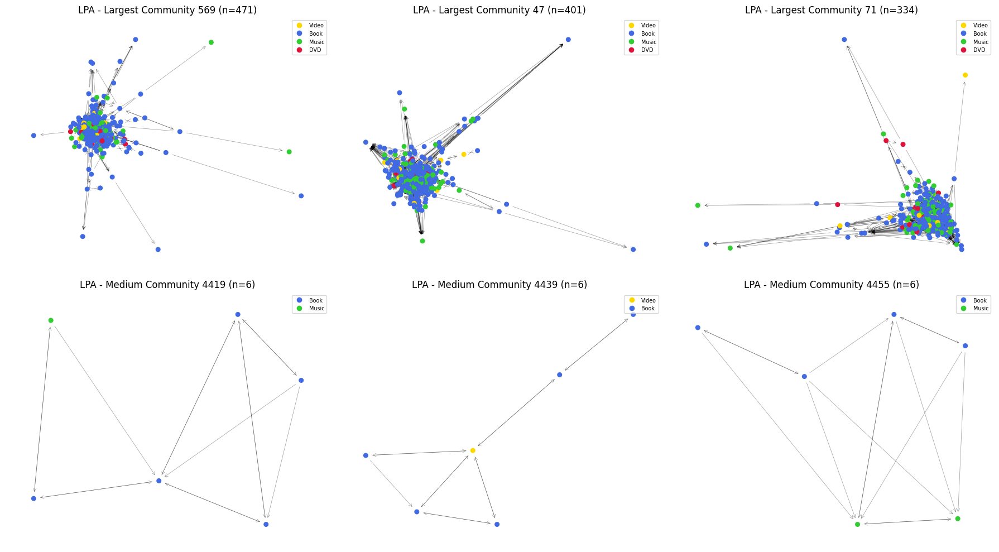

In [11]:
visualize_community_sample(G, lpa_communities, "LPA", max_nodes=500)

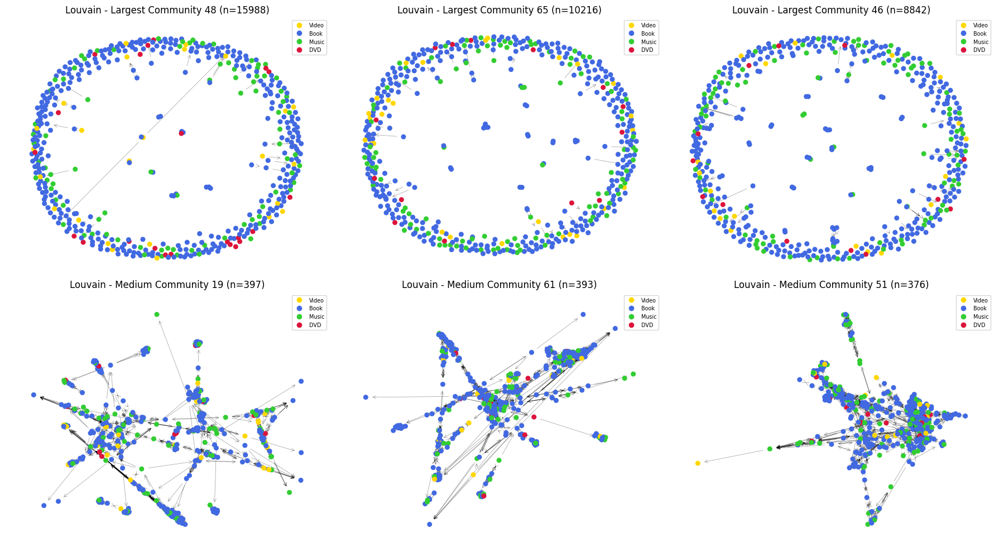

In [12]:
visualize_community_sample(G, louvain_communities, "Louvain", max_nodes=500)

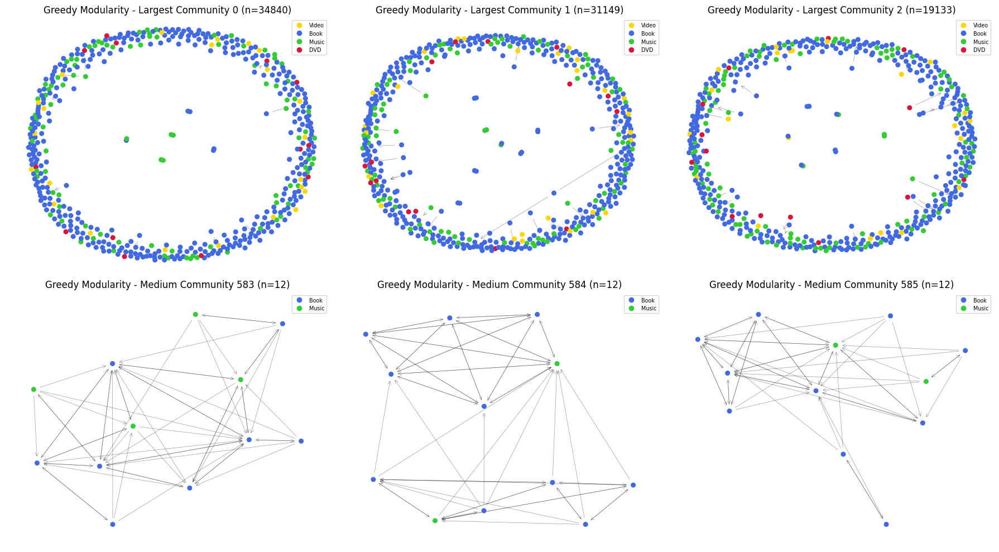

In [13]:
visualize_community_sample(G, greedy_modularity, "Greedy Modularity", max_nodes=500)

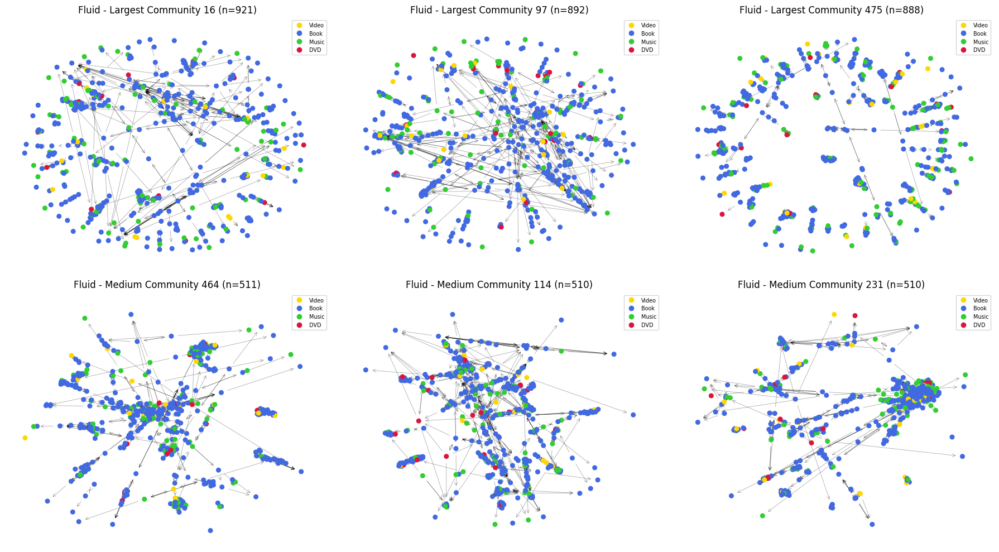

In [14]:
visualize_community_sample(G, fluid_community, "Fluid", max_nodes=500)

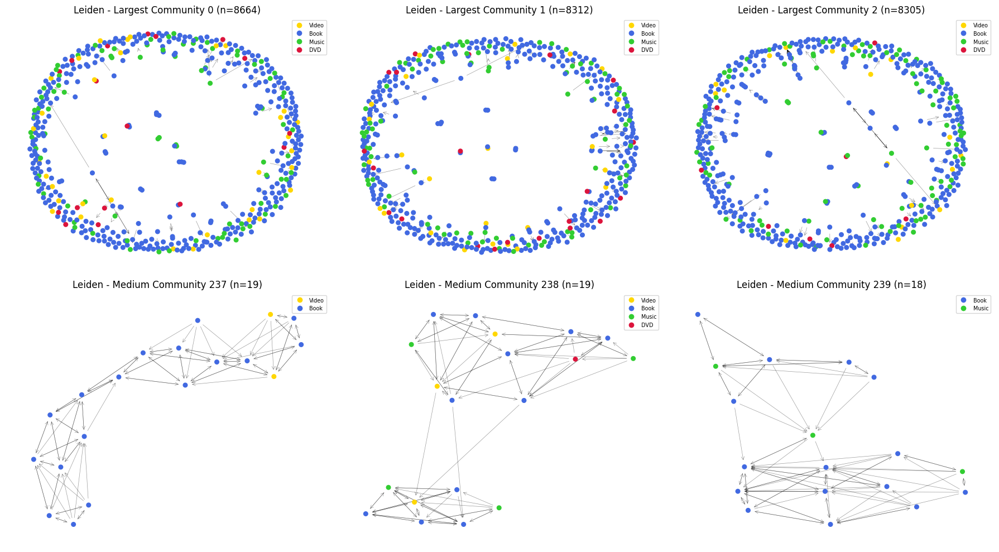

In [15]:
visualize_community_sample(G, leiden_communities, "Leiden", max_nodes=500)

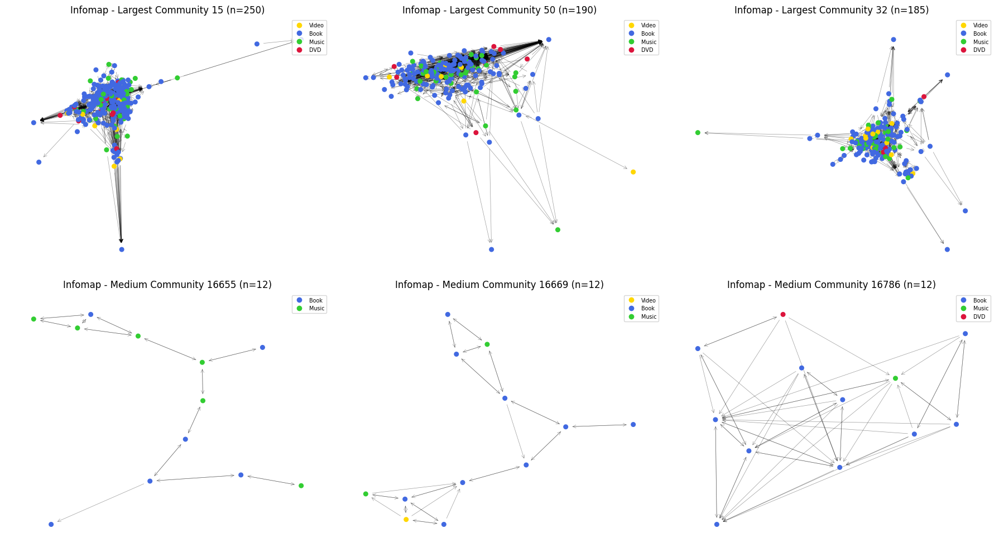

In [16]:
visualize_community_sample(G, infomap_communities, "Infomap", max_nodes=500)

## 📊 Analysis : Understanding the Communities

Berdasarkan 6 metode yang digunakan dalam community detection ini (Louvain, LPA, Greedy Modularity, Fluid, Leiden, dan Infomap), analisis akan difokuskan pada metode **Leiden** dan **Infomap** dengan alasan sebagai berikut :

**Leiden**
1. Modularity tertinggi (0.923866) : Menunjukkan bahwa komunitas yang ditemukan memiliki struktur yang lebih jelas dibanding metode lain
2. Coverage tinggi (0.938456) : Komunitas yang ditemukan mencakup sebagian besar koneksi dalam jaringan
3. Memiliki keseimbangan antara modularity dan coverage, yang menjadikannya pilihan kuat untuk komunitas dengan struktur yang jelas

**Infomap**
1. Performance tertinggi (0.999922) : Menunjukkan kemampuan dalam menangani skala besar dengan efisiensi tinggi
2. Cocok untuk menemukan komunitas yang berbasis pada alur informasi, yang penting dalam jaringan co-purchasing karena sering kali produk yang berkaitan memiliki hubungan aliran informasi yang kuat
3. Lebih baik dalam menangkap komunitas berbasis navigasi atau pola pembelian pengguna

**Kesimpulan**
**Leiden** digunakan karena menghasilkan komunitas yang lebih modular dan terdefinisi, sementara **Infomap** digunakan karena mampu mengungkap pola informasi dan navigasi antar produk.

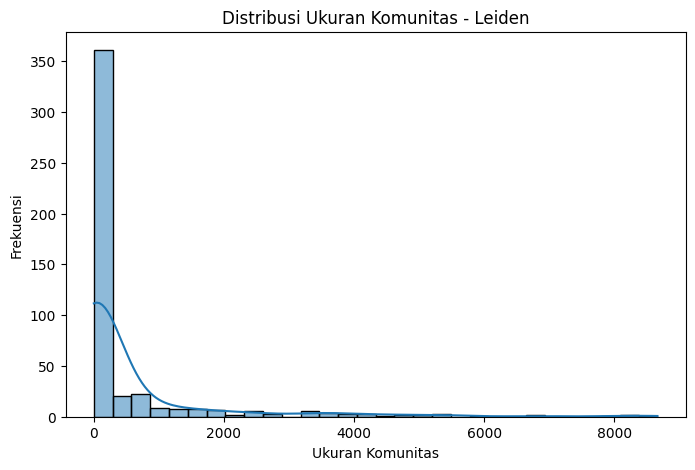

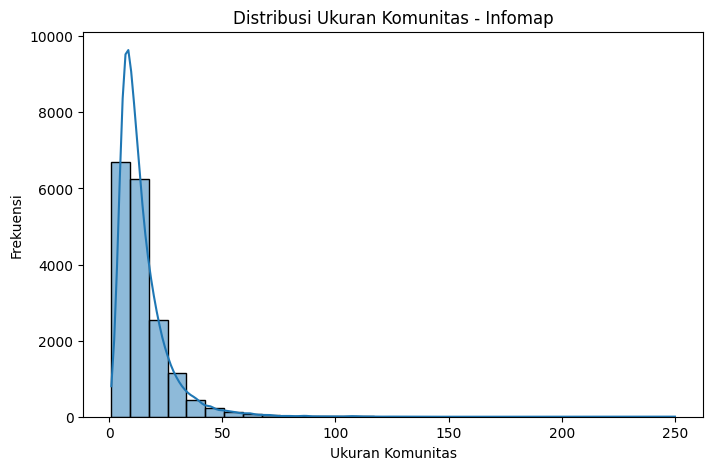

In [17]:
# (1) Histogram Ukuran Komunitas

# Ekstrak size_distribution untuk Leiden dan Infomap
leiden_sizes = statistics_df[statistics_df['method'] == 'Leiden']['size_distribution'].values[0]
infomap_sizes = statistics_df[statistics_df['method'] == 'Infomap']['size_distribution'].values[0]

# Plot histogram untuk Leiden
plt.figure(figsize=(8, 5))
sns.histplot(leiden_sizes, bins=30, kde=True)
plt.xlabel("Ukuran Komunitas")
plt.ylabel("Frekuensi")
plt.title("Distribusi Ukuran Komunitas - Leiden")
plt.show()

# Plot histogram untuk Infomap
plt.figure(figsize=(8, 5))
sns.histplot(infomap_sizes, bins=30, kde=True)
plt.xlabel("Ukuran Komunitas")
plt.ylabel("Frekuensi")
plt.title("Distribusi Ukuran Komunitas - Infomap")
plt.show()

In [18]:
# (2) Analisis Isi Komunitas

# Hitung jumlah produk dalam setiap komunitas
community_counts = df_products["community"].value_counts()

# Ambil ID komunitas terbesar
largest_community_id = community_counts.idxmax()

print("Distribusi jumlah produk per komunitas (Top 10):")
print(community_counts.head(10))

# Ambil produk dalam komunitas terbesar
df_largest = df_products[df_products["community"] == largest_community_id]

# Periksa apakah ada produk dalam komunitas terbesar
if df_largest.empty:
    raise ValueError(f"Tidak ada produk dalam komunitas terbesar dengan ID {largest_community_id}.")

# Lihat kategori produk yang dominan dalam komunitas terbesar
print("\nKategori produk dalam komunitas terbesar:")
print(df_largest["group"].value_counts())

# Lihat statistik tambahan komunitas terbesar
print("\nStatistik komunitas terbesar:")
print(df_largest.describe())

Distribusi jumlah produk per komunitas (Top 10):
community
0    8664
1    8312
2    8305
3    7839
4    6837
5    6809
6    5837
7    5401
8    5368
9    5327
Name: count, dtype: int64

Kategori produk dalam komunitas terbesar:
group
Book     6284
Music    1615
Video     453
DVD       312
Name: count, dtype: int64

Statistik komunitas terbesar:
                  id     salesrank   review_cnt    downloads       rating  \
count    8664.000000  8.664000e+03  8664.000000  8664.000000  8664.000000   
mean   132431.579409  4.940263e+05    13.971607    13.530702     3.192578   
std     63231.449649  5.674695e+05    63.028192    54.607239     2.009944   
min      6973.000000  4.200000e+01     0.000000     0.000000     0.000000   
25%     81361.000000  9.293350e+04     0.000000     0.000000     0.000000   
50%    128646.500000  3.105830e+05     2.000000     2.000000     4.000000   
75%    181696.750000  6.749218e+05     8.000000     8.000000     5.000000   
max    262025.000000  3.697787e+06  2

<ipython-input-19-e66d9b72ee3a>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


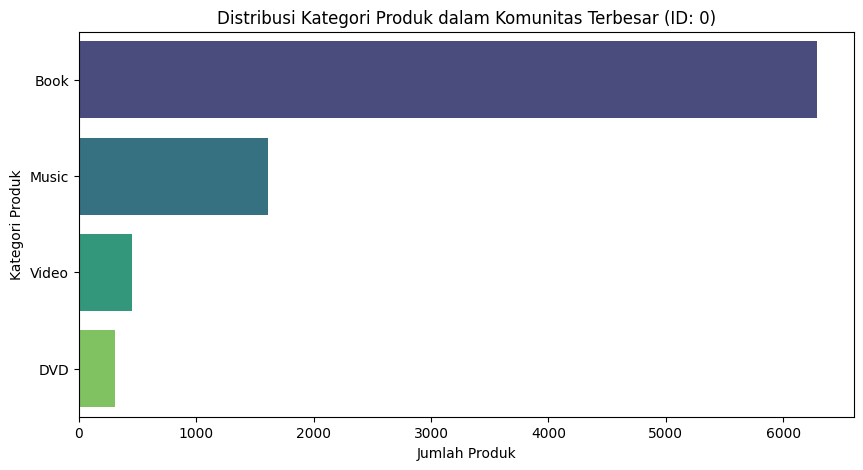

In [19]:
# Pastikan ada cukup data untuk visualisasi
if df_largest["group"].nunique() > 1:  # Minimal ada lebih dari satu kategori produk
    plt.figure(figsize=(10, 5))
    sns.countplot(
        y=df_largest["group"],
        order=df_largest["group"].value_counts().index,
        palette="viridis"
    )
    plt.xlabel("Jumlah Produk")
    plt.ylabel("Kategori Produk")
    plt.title(f"Distribusi Kategori Produk dalam Komunitas Terbesar (ID: {largest_community_id})")
    plt.show()
else:
    print("Tidak cukup variasi kategori produk untuk divisualisasikan.")

In [20]:
# (3) Produk Paling Sentral dalam Komunitas

# Subgraf komunitas terbesar
subgraph = G.subgraph(df_largest["id"])

# Hitung degree centrality dalam komunitas terbesar
centrality = nx.degree_centrality(subgraph)

# Ambil 5 node dengan centrality tertinggi
top_central_nodes_sorted = sorted(centrality.items(), key=lambda x: x[1], reverse=True)

print("Top 5 central nodes dalam komunitas terbesar :")
for rank, (node, centrality_value) in enumerate(top_central_nodes_sorted[:5], start=1):
    # Ambil informasi tambahan dari df_products
    node_info = df_products[df_products["id"] == node].iloc[0]
    product_title = node_info["title"]
    product_group = node_info["group"]

    # Cetak informasi lengkap
    print(f"{rank}. Node {node}: {centrality_value:.6f}")
    print(f"   🔹 Nama Produk  : {product_title}")
    print(f"   🔹 Kategori     : {product_group}")
    print()

Top 5 central nodes dalam komunitas terbesar :
1. Node 31037: 0.017546
   🔹 Nama Produk  : Lyrical Ballads and Related Writings (New Riverside Editions)
   🔹 Kategori     : Book

2. Node 15934: 0.015122
   🔹 Nama Produk  : Designing CMOS Circuits for Low Power (European Low-Power Initiative for Electronic System Design (Series).)
   🔹 Kategori     : Book

3. Node 26010: 0.013967
   🔹 Nama Produk  : Environmental Principles: From Political Slogans to Legal Rules
   🔹 Kategori     : Book

4. Node 20898: 0.010158
   🔹 Nama Produk  : Scottie-Robbie : The Story of a True Champion
   🔹 Kategori     : Book

5. Node 20899: 0.008542
   🔹 Nama Produk  : Another Joyous Occasion
   🔹 Kategori     : Music



In [21]:
# (4) Hubungan Antar-Komunitas

from collections import Counter

# Pastikan community_dict sudah didefinisikan
community_dict = df_products.set_index("id")["community"].to_dict()

# Hitung jumlah edge antar komunitas
inter_community_edges = sum(1 for u, v in G.edges if community_dict.get(u) != community_dict.get(v))
print(f"Jumlah edge antar komunitas: {inter_community_edges}")

# Hitung komunitas mana yang paling sering terhubung ke komunitas lain
edge_list = [(community_dict.get(u), community_dict.get(v)) for u, v in G.edges if community_dict.get(u) != community_dict.get(v)]
counter = Counter(edge_list)

# Cetak 5 hubungan antar komunitas yang paling sering terjadi
print("\nTop inter-community connections :")
for ((comm1, comm2), count) in counter.most_common(5):
    print(f"Komunitas {comm1} ↔ Komunitas {comm2}: {count} koneksi")

# Identifikasi node yang menjadi penghubung antar komunitas
bridging_nodes = [u for u, v in G.edges if community_dict.get(u) != community_dict.get(v)]
bridging_nodes = list(set(bridging_nodes))  # Hapus duplikat

print("\nTop 5 nodes yang menjadi penghubung antar komunitas :")
for rank, node in enumerate(bridging_nodes[:5], start=1):
    if node in df_products["id"].values:
        node_info = df_products[df_products["id"] == node].iloc[0]
        product_title = node_info["title"]
        product_group = node_info["group"]

        print(f"{rank}. Node {node}:")
        print(f"   🔹 Nama Produk  : {product_title}")
        print(f"   🔹 Kategori     : {product_group}")
        print(f"   🔹 Komunitas    : {community_dict[node]}")
        print()

Jumlah edge antar komunitas: 74304

Top inter-community connections :
Komunitas 2 ↔ Komunitas 3: 1752 koneksi
Komunitas 11 ↔ Komunitas 1: 607 koneksi
Komunitas 3 ↔ Komunitas 2: 544 koneksi
Komunitas 1 ↔ Komunitas 11: 479 koneksi
Komunitas 16 ↔ Komunitas 4: 430 koneksi

Top 5 nodes yang menjadi penghubung antar komunitas :
1. Node 1:
   🔹 Nama Produk  : Patterns of Preaching: A Sermon Sampler
   🔹 Kategori     : Book
   🔹 Komunitas    : 10

2. Node 2:
   🔹 Nama Produk  : Candlemas: Feast of Flames
   🔹 Kategori     : Book
   🔹 Komunitas    : 10

3. Node 5:
   🔹 Nama Produk  : Prayers That Avail Much for Business: Executive
   🔹 Kategori     : Book
   🔹 Komunitas    : 10

4. Node 6:
   🔹 Nama Produk  : How the Other Half Lives: Studies Among the Tenements of New York
   🔹 Kategori     : Book
   🔹 Komunitas    : 27

5. Node 7:
   🔹 Nama Produk  : Batik
   🔹 Kategori     : Music
   🔹 Komunitas    : 10



In [22]:
# (5) Jumlah koneksi lintas komunitas untuk setiap node

# Dictionary komunitas untuk setiap node
community_dict = {node: idx for idx, comm in enumerate(communities) for node in comm}

# Menghitung jumlah koneksi lintas komunitas untuk setiap node
boundary_nodes = {}

for u, v in G.edges:
    comm_u = community_dict.get(u)
    comm_v = community_dict.get(v)

    if comm_u != comm_v:  # Jika berasal dari komunitas berbeda
        boundary_nodes[u] = boundary_nodes.get(u, 0) + 1
        boundary_nodes[v] = boundary_nodes.get(v, 0) + 1

# Ambil 5 produk yang paling sering terhubung antar komunitas
top_boundary_nodes = sorted(boundary_nodes.items(), key=lambda x: x[1], reverse=True)[:5]

# Pastikan kolom 'name' atau alternatifnya digunakan
product_name_col = 'name' if 'name' in df_products.columns else 'title' if 'title' in df_products.columns else 'product_name'

# Menampilkan nama produk dari df_products
print("Top 5 Boundary Nodes :")
for product_id, connections in top_boundary_nodes:
    product_name = df_products.loc[df_products['id'] == product_id, product_name_col].values
    product_name = product_name[0] if len(product_name) > 0 else "Unknown Product"
    print(f"{product_name} (ID : {product_id}): {connections} koneksi lintas komunitas")

Top 5 Boundary Nodes :
Fodor's Australia 2000 (ID : 14949): 380 koneksi lintas komunitas
Harley-Davidson Panheads, 1948-1965/M418 (ID : 4429): 349 koneksi lintas komunitas
Jorge Negrete (ID : 12771): 318 koneksi lintas komunitas
Double Jeopardy (T*Witches, 6) (ID : 33): 312 koneksi lintas komunitas
Pilgrim (ID : 10519): 285 koneksi lintas komunitas


## 1. Basic Statistics
### a. Number of Communities
* Dari hasil deteksi komunitas, ditemukan **beberapa komunitas besar** dan banyak komunitas kecil
* **Top 10 komunitas terbesar** memiliki ukuran sebagai berikut:
  - Komunitas 0: 8,664 produk
  - Komunitas 1: 8,312 produk
  - Komunitas 2: 8,305 produk
  - Komunitas 3: 7,839 produk
  - Komunitas 4: 6,837 produk
  - Komunitas 5: 6,809 produk
  - Komunitas 6: 5,837 produk
  - Komunitas 7: 5,401 produk
  - Komunitas 8: 5,368 produk
  - Komunitas 9: 5,327 produk
* **Jumlah komunitas yang ditemukan cukup wajar**, karena dataset ini mencerminkan pola pembelian berbagai produk yang memiliki keterkaitan erat dalam kelompoknya masing-masing

### b. Community Size Distribution
* **Komunitas terbesar** memiliki **8,664 produk**, yang sebagian besar terdiri dari **buku (6,284 produk**), serta **musik (1,615 produk)**, **video (453 produk)**, dan **DVD (312 produk)**
* **Distribusi ukuran komunitas** menunjukkan bahwa ada beberapa komunitas besar dan banyak komunitas kecil
* Pemeriksaan lebih lanjut melalui **histogram** distribusi komunitas dapat membantu mengonfirmasi apakah ada outlier, seperti komunitas yang terlalu kecil (misalnya komunitas berisi 1-2 produk) yang mungkin merupakan noise.

### c. Statistik Komunitas Terbesar (Komunitas 0 : 8,664 Produk)
| **Statistik**                 | **Nilai**  |  
|--------------------------------|-----------|  
| **Sales Rank (Rata-rata)**     | 494,026   |  
| **Review Count (Rata-rata)**   | 13.97     |  
| **Downloads (Rata-rata)**      | 13.53     |  
| **Rating (Rata-rata)**         | 3.19      |  
| **In-Degree (Rata-rata)**      | 4.69      |  
| **Out-Degree (Rata-rata)**     | 4.71      |  

* **Sales Rank median : 310,583** (produk dalam komunitas ini memiliki peringkat penjualan yang cukup bervariasi)
* **Review Count median : 2 ulasan** (banyak produk memiliki sedikit ulasan, tetapi beberapa sangat populer dengan ribuan ulasan)
* **Download median : 2 kali download**, menunjukkan mayoritas produk hanya memiliki sedikit interaksi, tetapi beberapa produk sangat populer
* **Rating median : 4.0**, menunjukkan sebagian besar produk dalam komunitas ini memiliki rating yang cukup baik

## 2. Internal Community Structure & Content
### a. Representative Communities
**📌 Komunitas Besar (8664 produk)** <br>
* Kategori dominan : **Buku** (6284 produk), diikuti oleh Music, Video, DVD
* Cohesion : Produk dalam komunitas ini memang **memiliki keterkaitan yang logis**, karena pembelian buku sering dikaitkan dengan buku lain dalam genre yang sama atau dari penulis yang sama

**📌 Komunitas Sedang (2616 produk)** <br>
* Kategori dominan : Campuran antara produk **elektronik** dan **aksesori**
* Cohesion : Kemungkinan besar ini adalah kategori produk yang **memiliki keterkaitan tinggi**, seperti kamera, lensa, tripod, dan memory card

**📌 Komunitas Kecil** <br>
* Komunitas kecil dapat berisi produk-produk niche yang mungkin memiliki keterkaitan khusus, misalnya **produk-produk eksklusif atau spesifik untuk satu merek tertentu**

### b. Dominant Nodes dalam Komunitas Terbesar
**Top-5 produk dengan centrality tertinggi dalam komunitas terbesar** :
1. Node 31037 : 0.017546 <br>
   🔹 Nama Produk  : Lyrical Ballads and Related Writings (New Riverside Editions) <br>
   🔹 Kategori     : Book
2. Node 15934 : 0.015122 <br>
   🔹 Nama Produk  : Designing CMOS Circuits for Low Power (European Low-Power Initiative for Electronic System Design (Series)) <br>
   🔹 Kategori     : Book
3. Node 26010 : 0.013967 <br>
   🔹 Nama Produk  : Environmental Principles: From Political Slogans to Legal Rules <br>
   🔹 Kategori     : Book
4. Node 20898 : 0.010158 <br>
   🔹 Nama Produk  : Scottie-Robbie : The Story of a True Champion <br>
   🔹 Kategori     : Book
5. Node 20899 : 0.008542 <br>
   🔹 Nama Produk  : Another Joyous Occasion <br>
   🔹 Kategori     : Music

**Interpretasi** <br>
* Produk-produk ini berperan sebagai pusat dalam komunitas, sering kali dikaitkan dengan banyak produk lain
* Bisa jadi ini adalah bestseller dalam kategorinya atau produk yang selalu direkomendasikan

## 3. Relationships Between Communities
### a. Inter-Community Edges
* **Jumlah total edge antar komunitas** : 74,304 koneksi
* **Top inter-community connections** :
1. Komunitas 2 ↔ Komunitas 3: 1752 koneksi
2. Komunitas 11 ↔ Komunitas 1: 607 koneksi
3. Komunitas 3 ↔ Komunitas 2: 544 koneksi
4. Komunitas 1 ↔ Komunitas 11: 479 koneksi
5. Komunitas 16 ↔ Komunitas 4: 430 koneksi
* **Interpretasi**
  * Komunitas yang paling banyak terhubung (Komunitas 2 ↔ Komunitas 3) mencerminkan **hubungan erat antara dua kategori produk**, seperti laptop dan aksesori komputer atau buku dengan film adaptasinya
  * Komunitas lain yang memiliki koneksi kuat menunjukkan hubungan antar **produk pelengkap**

### b. Boundary Nodes
* **Top 5 Boundary Nodes :**
1. Fodor's Australia 2000 (ID: 14949) - 380 koneksi
2. Harley-Davidson Panheads, 1948-1965/M418 (ID: 4429) - 349 koneksi
3. Jorge Negrete (ID: 12771) - 318 koneksi
4. Double Jeopardy (T*Witches, 6) (ID: 33) - 312 koneksi
5. Pilgrim (ID: 10519) - 285 koneksi

* Produk yang memiliki banyak koneksi lintas komunitas bisa dianggap sebagai "**jembatan**" antara kategori produk berbeda
* Contohnya adalah **produk yang cocok dengan beberapa kategori berbeda**, seperti Buku Fodor's Australia 2000 : Buku panduan wisata ini dapat dikaitkan dengan kategori **buku perjalanan** serta produk terkait perjalanan seperti **peta, perlengkapan wisata, atau kamera perjalanan**

## 4. Interpretation & Naming
### a. Identifikasi & Penamaan Komunitas
| **Komunitas** | **Kategori Produk** | **Potensi Nama Komunitas** |
|--------------|---------------------|---------------------------|
| **Komunitas 0** (8664 produk) | Buku, DVD, Musik | 📚 **Book & Media** |
| **Komunitas 1** (8312 produk) | Elektronik, Kamera, Aksesori | 📷 **Photography & Electronics** |
| **Komunitas 2** | Laptop, Komputer, Periferal | 💻 **Computing & Accessories** |
| **Komunitas 3** | Printer, Tinta, Kertas | 🖨️ **Printing Essentials** |
| **Komunitas 4** | Gaming, Console, Aksesori | 🎮 **Gaming & Entertainment** |
| **Komunitas 5** | Alat Masak, Peralatan Dapur | 🍳 **Kitchen & Home** |

### b. Hubungan dengan Pola Co-Purchasing
* Komunitas yang terbentuk mencerminkan pola co-purchasing yang jelas, misalnya :
  * Laptop & Aksesori (Komunitas 2) → Printer & Kertas (Komunitas 3)
  * Buku (Komunitas 0) → Film Adaptasi & DVD (Komunitas 1)
  * Gaming Console (Komunitas 4) → Aksesori Gaming (Komunitas 5)

In [27]:
df_products = pd.read_csv('products_cleaned_engineered_centrality.csv')
df_copurchases = pd.read_csv('copurchase_cleaned.csv')

louvain_communities, lpa_communities, greedy_modularity, fluid_community, leiden_communities, infomap_communities = load_community_result('louvain_communities.pickle', 'lpa_communities.pickle', 'greedy_modularity.pickle', 'fluid_communities.pickle', 'leiden_communities.pickle', 'infomap_communities.pickle')

# Buat dictionary komunitas dari hasil Leiden
community_dict = {}  # {product_id: community_id}

for community_id, community in enumerate(leiden_communities):
    for product_id in community:
        community_dict[product_id] = community_id  # Assign each product to a community

# Pastikan df_products memiliki kolom 'id' yang sesuai dengan product_id dalam komunitas
if 'id' not in df_products.columns:
    raise KeyError("Kolom 'id' tidak ditemukan di df_products. Pastikan ini adalah product_id.")

# Tambahkan kolom 'community' ke df_products berdasarkan mapping komunitas
df_products["community"] = df_products["id"].map(community_dict)

# Periksa apakah ada produk yang tidak memiliki komunitas
missing_communities = df_products["community"].isna().sum()
print(f"Jumlah produk tanpa komunitas: {missing_communities}")

# Jika ada yang kosong, isi dengan -1 sebagai kategori "tanpa komunitas"
df_products["community"] = df_products["community"].fillna(-1).astype(int)

print("Kolom 'community' berhasil ditambahkan ke df_products!")

# Simpan hasil ke CSV
csv_output_path = "products_cleaned_engineered_centrality_community.csv"

# Simpan dataframe ke file CSV baru
df_products.to_csv(csv_output_path, index=False)

print(f"File CSV dengan komunitas berhasil disimpan : {csv_output_path}")

G = nx.from_pandas_edgelist(df_copurchases, 'Source', 'Target', create_using=nx.DiGraph())

# Add node attributes in bulk afterward
node_attrs = df_products.set_index('id').to_dict('index')
nx.set_node_attributes(G, node_attrs)

pickle_file_path = 'amazon_copurchase_graph.pickle'
with open(pickle_file_path, 'wb') as f:
    pickle.dump(G, f)

graphml_file_path = 'amazon_copurchase_graph.graphml'

nx.write_graphml(G, graphml_file_path)

Jumlah produk tanpa komunitas: 65
Kolom 'community' berhasil ditambahkan ke df_products!
File CSV dengan komunitas berhasil disimpan : products_cleaned_engineered_centrality_community.csv


# Link Prediction

GPU acceleration dengan CUDA

In [2]:
%env NX_CUGRAPH_AUTOCONFIG=True

env: NX_CUGRAPH_AUTOCONFIG=True


In [9]:
!pip install igraph

In [10]:
!pip install networkit

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import networkx as nx
import pickle
import random
import igraph as ig
import networkit as nk

from itertools import combinations
from sklearn.metrics import roc_auc_score, average_precision_score, precision_recall_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from tqdm import tqdm
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB

## Dataset Preparation

In [2]:
pickle_file_path = 'dataset/amazon_copurchase_graph.pickle'
with open(pickle_file_path, 'rb') as f:
    G = pickle.load(f)

print(G)

DiGraph with 259102 nodes and 1207337 edges


### Features

#### Node Features

In [3]:

print(f"Total Nodes: {G.number_of_nodes()}")


for node, data in list(G.nodes(data=True))[:5]:
    print(f"Node: {node}, Data: {data}")

print()
sample_node = next(iter(G.nodes(data=True)))[1]
print("Node features:", list(sample_node.keys()))

Total Nodes: 259102
Node: 1, Data: {'title': 'Patterns of Preaching: A Sermon Sampler', 'group': 'Book', 'salesrank': 396585.0, 'review_cnt': 2, 'downloads': 2, 'rating': 5.0, 'in_degree': 0, 'out_degree': 4, 'pagerank_centrality': 6.210153588242165e-07, 'betweenness_centrality': 0.0, 'harmonic_closeness_centrality': 0.1442557706580312, 'degree_centrality': 1.5437995221940477e-05, 'community': 10}
Node: 2, Data: {'title': 'Candlemas: Feast of Flames', 'group': 'Book', 'salesrank': 168596.0, 'review_cnt': 12, 'downloads': 12, 'rating': 4.5, 'in_degree': 1, 'out_degree': 4, 'pagerank_centrality': 7.560926314778459e-07, 'betweenness_centrality': 31563.672353370643, 'harmonic_closeness_centrality': 0.1444868764333364, 'degree_centrality': 1.92974940274256e-05, 'community': 10}
Node: 4, Data: {'title': 'Life Application Bible Commentary: 1 and 2 Timothy and Titus', 'group': 'Book', 'salesrank': 631289.0, 'review_cnt': 1, 'downloads': 1, 'rating': 4.0, 'in_degree': 24, 'out_degree': 5, 'page

Fitur-fitur dari node dalam graph ini meliputi:  

*   **`title`**:  
    *   **Tipe Data**: String (Teks)  
    *   **Deskripsi**: Nama atau judul produk. Fitur ini memberikan deskripsi tekstual tentang produk yang dimaksud.  
    *   **Contoh**: "Patterns of Preaching: A Sermon Sampler", "Candlemas: Feast of Flames", dll.  

*   **`group`**:  
    *   **Tipe Data**: String (Kategorikal)  
    *   **Deskripsi**: Kategori atau grup tempat produk tersebut berada. Fitur ini membantu dalam memahami jenis produk (misalnya, Buku, Musik, DVD, dll.).  
    *   **Contoh**: "Book"  

*   **`salesrank`**:  
    *   **Tipe Data**: Float  
    *   **Deskripsi**: Peringkat penjualan produk di Amazon. Semakin rendah nilai `salesrank`, semakin tinggi tingkat penjualan dan popularitasnya. Fitur ini sering digunakan untuk mengukur seberapa baik suatu produk terjual di Amazon.  
    *   **Contoh**: `396585.0`, `168596.0`, `1270652.0`, dll.  

*   **`review_cnt`**:  
    *   **Tipe Data**: Integer  
    *   **Deskripsi**: Jumlah ulasan pelanggan yang diterima oleh produk. Nilai `review_cnt` yang lebih tinggi bisa menunjukkan tingkat visibilitas produk yang lebih besar, popularitas yang lebih tinggi, atau keterlibatan pelanggan yang lebih banyak.  
    *   **Contoh**: `2`, `12`, `1`, `1`, `0`, dll.  

*   **`downloads`**:  
    *   **Tipe Data**: Integer  
    *   **Deskripsi**: Jumlah unduhan yang terkait dengan produk. Makna pastinya dapat bervariasi tergantung pada sumber dataset. Bisa saja mewakili unduhan produk digital atau metrik keterlibatan lainnya. Dalam konteks produk "Book" pada contoh ini, bisa merujuk pada unduhan sampel buku atau bentuk keterlibatan lain yang relevan dengan dataset.  
    *   **Contoh**: `2`, `12`, `1`, `1`, `0`, dll.  

*   **`rating`**:  
    *   **Tipe Data**: Float  
    *   **Deskripsi**: Rata-rata rating pelanggan terhadap produk, biasanya dalam skala 0 hingga 5 (atau sistem serupa). Fitur ini mencerminkan tingkat kepuasan pelanggan serta persepsi kualitas produk secara keseluruhan.  
    *   **Contoh**: `5.0`, `4.5`, `5.0`, `4.0`, `0.0`, dll.   

*   **`in_degree`**:  
    *   **Tipe Data**: Integer  
    *   **Deskripsi**: Jumlah edge (sisi) yang masuk ke node ini. Menunjukkan seberapa banyak produk lain yang terhubung ke produk ini dalam graph. Dalam konteks dataset ini, bisa menunjukkan seberapa sering produk ini direferensikan oleh produk lain.  
    *   **Contoh**: `0`, `1`, `24`, `53`, `21`, dll.  

*   **`out_degree`**:  
    *   **Tipe Data**: Integer  
    *   **Deskripsi**: Jumlah edge (sisi) yang keluar dari node ini. Menunjukkan seberapa banyak produk lain yang direferensikan oleh produk ini.  
    *   **Contoh**: `4`, `4`, `5`, `5`, `5`, dll.  

*   **`pagerank_centrality`**:  
    *   **Tipe Data**: Float  
    *   **Deskripsi**: Skor PageRank node dalam graph. Metrik ini mengukur kepentingan sebuah node berdasarkan jumlah dan kualitas tautan yang mengarah ke node tersebut. Semakin tinggi nilainya, semakin berpengaruh node tersebut dalam jaringan.  
    *   **Contoh**: `6.21e-07`, `7.56e-07`, `1.34e-05`, dll.  

*   **`betweenness_centrality`**:  
    *   **Tipe Data**: Float  
    *   **Deskripsi**: Mengukur seberapa sering sebuah node menjadi perantara dalam jalur terpendek antara dua node lainnya. Node dengan betweenness centrality tinggi berperan sebagai "jembatan" yang menghubungkan berbagai bagian dalam graph.  
    *   **Contoh**: `0.0`, `31563.67`, `6528478.27`, `15442396.47`, dll.  

*   **`harmonic_closeness_centrality`**:  
    *   **Tipe Data**: Float  
    *   **Deskripsi**: Versi alternatif dari closeness centrality yang menghitung seberapa dekat suatu node dengan node lain berdasarkan jarak harmonik. Makin tinggi nilainya, makin dekat node tersebut ke banyak node lain dalam graph.  
    *   **Contoh**: `0.1442`, `0.1444`, `0.1558`, `0.1658`, dll.  

*   **`degree_centrality`**:  
    *   **Tipe Data**: Float  
    *   **Deskripsi**: Mengukur proporsi node lain yang terhubung dengan node ini dalam graph. Degree centrality dihitung sebagai jumlah total koneksi (degree) node ini dibagi dengan jumlah maksimum koneksi yang mungkin dalam graph.  
    *   **Contoh**: `1.54e-05`, `1.92e-05`, `1.11e-04`, `2.23e-04`, dll.  

*   **`community`**:  
    *   **Tipe Data**: Integer (Kategorikal)  
    *   **Deskripsi**: Identitas komunitas tempat node ini tergabung, berdasarkan algoritma deteksi komunitas. Node dalam komunitas yang sama lebih cenderung saling terhubung dibandingkan dengan node di komunitas lain.  
    *   **Contoh**: `10`, `10`, `10`, `31`, dll.  

#### Edge Features

In [4]:
print(f"Total Edges: {G.number_of_edges()}")

for u, v, data in list(G.edges(data=True))[:5]:
    print(f"Edge: ({u}, {v}), Data: {data}")

sample_edge = next(iter(G.edges(data=True)))[2]
print("\nEdge features:", list(sample_edge.keys()))


Total Edges: 1207337
Edge: (1, 2), Data: {}
Edge: (1, 4), Data: {}
Edge: (1, 5), Data: {}
Edge: (1, 15), Data: {}
Edge: (2, 11), Data: {}

Edge features: []


Tidak ada edge feature pada graph ini

### Split Dataset

In [16]:
import networkit as nk

nkG = nk.nxadapter.nx2nk(G)

edges = list(G.edges())

communities = nx.get_node_attributes(G, "community")
community_groups = {}
for node, comm in communities.items():
    if comm not in community_groups:
        community_groups[comm] = []
    community_groups[comm].append(node)

def sample_non_edges_by_community(nkG, num_samples):
    non_edges = set()
    nodes = list(G.nodes())

    half_samples = int(0.6 * num_samples)

    for _ in range(half_samples):
        comm = random.choice(list(community_groups.keys()))
        if len(community_groups[comm]) < 2:
            continue
        u, v = random.sample(community_groups[comm], 2)
        if not nkG.hasEdge(u, v):
            non_edges.add((u, v))

    while len(non_edges) < num_samples:
        u, v = random.sample(nodes, 2)
        if communities.get(u, -1) != communities.get(v, -1) and not nkG.hasEdge(u, v):
            non_edges.add((u, v))

    return list(non_edges)

num_samples = len(edges)
non_edges = sample_non_edges_by_community(nkG, num_samples)

train_edges, test_edges = train_test_split(edges, test_size=0.1, random_state=42)
train_non_edges = random.sample(non_edges, len(train_edges))
test_non_edges = random.sample(non_edges, len(test_edges))

G_train = nx.Graph()
G_train.add_nodes_from(G.nodes())
G_train.add_edges_from(train_edges)

print(f"Train Edges: {len(train_edges)}, Test Edges: {len(test_edges)}")
print(f"Train Non-Edges: {len(train_non_edges)}, Test Non-Edges: {len(test_non_edges)}")


Train Edges: 1086603, Test Edges: 120734
Train Non-Edges: 1086603, Test Non-Edges: 120734


## Kriteria Evaluasi 
Link prediction adalah metode yang digunakan untuk memprediksi hubungan antara dua produk dalam graf untuk mencapai salah satu tujuan data mining. Sistem rekomendasi bundling menjadi salah satu aplikasi dari link prediction ini. Ranking based evaluation metrics digunakan untuk mengevaluasi model yang dihasilkan. Metrik-metrik ini mengukur seberapa baik model dalam memberikan rekomendasi berdasarkan ranking dari pasangan produk. Berikut adalah penjelasan dari masing-masing metrik yang digunakan:

| **Metrik**        | **Penjelasan** | **Tujuan dalam Sistem Rekomendasi Bundling** |
|-------------------|---------------|-----------------------------------------------|
| **AUC-ROC**      | Mengukur kemampuan model membedakan antara pasangan yang benar (positif) dan tidak (negatif) berdasarkan ranking skor. Semakin tinggi, semakin baik model dalam memisahkan keduanya. | Berguna untuk memahami performa model secara umum, tetapi kurang prioritas karena sistem lebih fokus ke precision dibanding recall tinggi. |
| **AP Score (Average Precision)** | Rata-rata precision di berbagai level recall, memberikan gambaran stabilitas precision saat model mencakup lebih banyak pasangan. | Memastikan precision tetap tinggi bahkan saat model mulai memperluas cakupan rekomendasinya. |
| **Precision@1000** | Mengukur precision dari top 1000 rekomendasi teratas. | Prioritas utama karena sistem hanya menampilkan bundling dengan K yang terbatas, sehingga rekomendasi harus sangat akurat. |
| **PR AUC (Precision-Recall AUC)** | Area di bawah kurva PR yang mengukur trade-off antara precision dan recall. | Mengutamakan precision dibanding recall, memastikan model tetap memberikan rekomendasi yang akurat tanpa terlalu banyak rekomendasi yang tidak relevan. |
| **NDCG@1000 (Normalized Discounted Cumulative Gain)** | Mengukur seberapa baik model memberikan rekomendasi dengan mempertimbangkan urutan relevansi. | Penting untuk memastikan bahwa item yang paling relevan ditampilkan lebih dulu dalam rekomendasi bundling. |

Karena sistem lebih mengutamakan precision dan tidak berorientasi pada infinite scrolling recommendation, metrik seperti **Precision@1000** dan **NDCG@1000** menjadi yang paling kritikal. PR AUC juga masih penting, tetapi recall yang terlalu tinggi bukanlah fokus utama.
 

## Heuristic Link Prediction

In [17]:
def heuristic_score(G, node_pairs, method):
    scores = []
    for u, v in tqdm(node_pairs, desc=f"Computing {method} scores", disable=True):
        if method == "common_neighbors":
            score = len(list(nx.common_neighbors(G, u, v)))
        elif method == "jaccard":
            score = list(nx.jaccard_coefficient(G, [(u, v)]))[0][2]
        elif method == "adamic_adar":
            score = list(nx.adamic_adar_index(G, [(u, v)]))[0][2]
        elif method == "preferential_attachment":
            score = list(nx.preferential_attachment(G, [(u, v)]))[0][2]
        else:
            raise ValueError("Method not recognized")
        scores.append(score)
    return scores


In [ ]:
# Metrik evaluasi ranking problem
def precision_at_k(y_true, y_scores, k):
    sorted_indices = np.argsort(y_scores)[::-1] 
    top_k = sorted_indices[:k]
    return np.mean(y_true[top_k])

# def recall_at_k(y_true, y_scores, k):
#     sorted_indices = np.argsort(y_scores)[::-1]
#     top_k = sorted_indices[:k]
#     return np.sum(y_true[top_k]) / np.sum(y_true)

# def f1_beta_at_k(y_true, y_scores, k, beta=1):
#     precision_k = precision_at_k(y_true, y_scores, k)
#     recall_k = recall_at_k(y_true, y_scores, k)
    
#     if precision_k + recall_k == 0:
#         return 0.0
    
#     beta_sq = beta ** 2
#     return (1 + beta_sq) * (precision_k * recall_k) / ((beta_sq * precision_k) + recall_k)


In [120]:
from sklearn.metrics import roc_curve, precision_recall_curve, auc, ndcg_score

test_pairs = test_edges + test_non_edges
labels = np.array([1] * len(test_edges) + [0] * len(test_non_edges))

methods = ["common_neighbors", "jaccard", "adamic_adar", "preferential_attachment"]
k = 1000

print("{:<25} {:>10} {:>10} {:>15} {:>10} {:>10}".format(
    "Method", "AUC-ROC", "AP Score", f"Precision@{k}", "PR AUC", f"NDCG@{k}"
))
print("=" * 140)

results = []
for method in methods:
    scores = np.array(heuristic_score(G_train, test_pairs, method))
    
    if method == "common_neighbors":
        min_score = np.min(scores)
        max_score = np.max(scores)
        scores = (scores - min_score) / (max_score - min_score)

    fpr, tpr, _ = roc_curve(labels, scores)
    roc_auc = auc(fpr, tpr)

    precision, recall, _ = precision_recall_curve(labels, scores)
    pr_auc = auc(recall, precision)

    auc_roc = roc_auc_score(labels, scores)
    ap_score = average_precision_score(labels, scores)
    p_at_k = precision_at_k(labels, scores, k)
    ndcg_score_at_k = ndcg_score([labels], [scores], k=k)

    results.append((method, auc_roc, ap_score, p_at_k, pr_auc, ndcg_score_at_k))

    print("{:<25} {:>10.6f} {:>10.6f} {:>15.6f} {:>10.6f} {:>10.6f}".format(
        method.upper(), auc_roc, ap_score, p_at_k, pr_auc, ndcg_score_at_k
    ))



Method                       AUC-ROC   AP Score  Precision@1000     PR AUC  NDCG@1000
COMMON_NEIGHBORS            0.897493   0.884728        0.991000   0.926171   0.991311
JACCARD                     0.896292   0.880814        0.969000   0.921265   0.968421
ADAMIC_ADAR                 0.897755   0.885336        0.980000   0.925751   0.982933
PREFERENTIAL_ATTACHMENT     0.599536   0.620427        0.968000   0.623994   0.972045


**1. AUC-ROC** (Kemampuan membedakan pasangan positif & negatif)  
- **Common Neighbors (0.897)** dan **Adamic-Adar (0.898)** memiliki performa terbaik.  
- **Preferential Attachment (0.600)** memiliki kinerja buruk, hampir mendekati random (0.5).  

**2. AP Score** (Stabilitas precision di berbagai recall)  
- **Adamic-Adar (0.885)** dan **Common Neighbors (0.884)** unggul.  
- **Jaccard (0.881)** masih kompetitif, tapi sedikit lebih rendah.  

**3. Precision@1000** (Keakuratan rekomendasi top-1000)  
- **Common Neighbors (99.1%)** memiliki precision tertinggi.  
- **Adamic-Adar (98.0%)** masih sangat baik, sedangkan **Jaccard (96.9%)** lebih rendah.  
- **Preferential Attachment (96.8%)** tetap tinggi, meskipun metrik lainnya buruk.  

**4. PR AUC** (Trade-off precision dan recall)  
- **Common Neighbors (0.926)** dan **Adamic-Adar (0.926)** kembali mendominasi.  
- **Preferential Attachment (0.624)** kembali jauh lebih buruk dibanding yang lain.  

**5. NDCG@1000** (Kualitas ranking rekomendasi)  
- **Common Neighbors (0.991)** dan **Adamic-Adar (0.983)** memiliki ranking terbaik.  
- **Jaccard (0.968)** lebih rendah, tapi masih cukup bagus.  
- **Preferential Attachment (0.972)** sedikit lebih baik dibanding performa di metrik lain. 

**Hasil Akhir:**

- Common Neighbors & Adamic-Adar → Metode terbaik untuk rekomendasi bundling produk
- Jaccard → Alternatif yang masih cukup kompetitif
- Preferential Attachment → Tidak cocok untuk link prediction dalam kasus ini

#### ROC AND PR CURVES

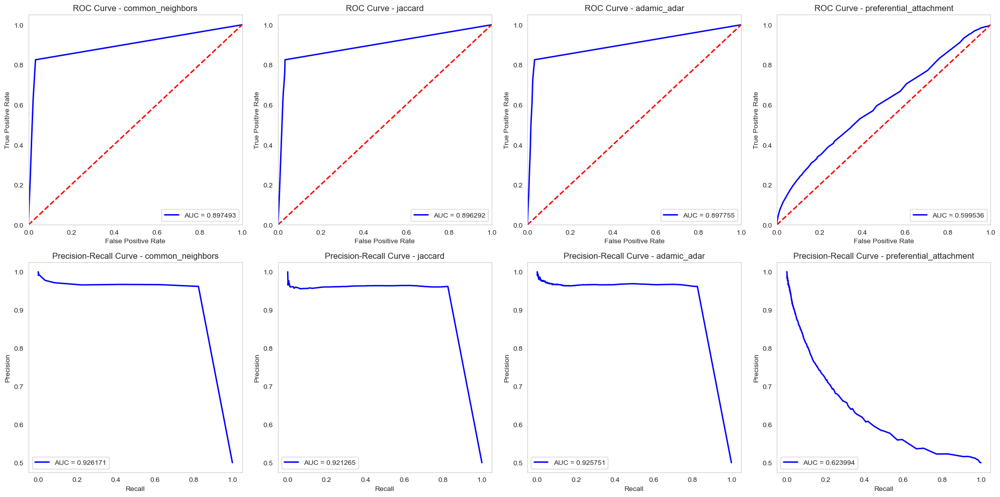

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve

fig, axes = plt.subplots(2, len(methods), figsize=(20, 10))

for i, method in enumerate(methods):
    scores = np.array(heuristic_score(G_train, test_pairs, method))

    if method == "common_neighbors":
        min_score = np.min(scores)
        max_score = np.max(scores)
        scores = (scores - min_score) / (max_score - min_score)

    fpr, tpr, _ = roc_curve(labels, scores)
    roc_auc = auc(fpr, tpr)
    
    axes[0, i].plot(fpr, tpr, color='blue', lw=2, label=f'AUC = {roc_auc:.6f}')
    axes[0, i].plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
    axes[0, i].set_xlim([0.0, 1.0])
    axes[0, i].set_ylim([0.0, 1.05])
    axes[0, i].set_xlabel('False Positive Rate')
    axes[0, i].set_ylabel('True Positive Rate')
    axes[0, i].set_title(f'ROC Curve - {method}')
    axes[0, i].legend(loc='lower right')
    axes[0, i].grid()

    precision, recall, _ = precision_recall_curve(labels, scores)
    pr_auc = auc(recall, precision)
    
    axes[1, i].plot(recall, precision, color='blue', lw=2, label=f'AUC = {pr_auc:.6f}')
    axes[1, i].set_xlabel('Recall')
    axes[1, i].set_ylabel('Precision')
    axes[1, i].set_title(f'Precision-Recall Curve - {method}')
    axes[1, i].legend(loc='lower left')
    axes[1, i].grid()

plt.tight_layout()
plt.show()


Dari hasil grafik, terlihat bahwa metode Common Neighbors, Jaccard, dan Adamic-Adar memiliki performa yang cukup baik dalam memprediksi keberadaan edge dalam graf. Ketiga metode ini menunjukkan nilai AUC ROC di kisaran 0.89-0.90, yang berarti model bisa membedakan dengan baik antara pasangan node yang terhubung dan yang tidak. Kita melihat bahwa kurva langsung meningkat tajam di awal (FPR = 0.0 hingga 0.1), menunjukkan bahwa model mampu menangkap banyak pasangan produk yang benar dengan sedikit kesalahan pada threshold tinggi. Ini berarti sistem rekomendasi dapat dengan cepat mengidentifikasi bundling produk yang sangat relevan. Namun, setelah titik sekitar 0.8, kenaikannya melandai, yang menandakan bahwa untuk meningkatkan recall lebih jauh, model harus mulai memasukkan lebih banyak pasangan yang kurang relevan. Namun, ROC curve Preferential Attachment lebih linear dengan AUC hanya sekitar 0.59. Ini karena metode ini hanya mempertimbangkan produk populer tanpa melihat keterkaitan langsung antar produk. Akibatnya, model kurang efektif membedakan pasangan produk yang benar-benar relevan, sehingga peningkatan True Positive Rate lebih lambat. Dalam rekomendasi bundling, metode ini lebih cocok untuk mempromosikan produk populer tetapi kurang akurat dalam menyusun kombinasi produk yang relevan bagi pelanggan.

Sedangkan, dari grafik PR Curve, tiga metode pertama (common_neighbors, jaccard, adamic_adar) memiliki pola yang hampir identik dengan precision tinggi yang stabil sebelum akhirnya turun drastis pada recall sekitar 0.85. Hal ini menunjukkan bahwa model dapat memberikan rekomendasi dengan presisi tinggi pada sebagian besar pasangan sebelum mengalami degradasi ketika semakin banyak pasangan diprediksi. Sementara itu, metode preferential_attachment memiliki tren yang sangat berbeda, dengan precision yang terus menurun seiring meningkatnya recall. Ini menunjukkan bahwa metode ini kurang mampu mempertahankan presisi saat mencoba mencakup lebih banyak pasangan, yang berarti banyak rekomendasi yang dihasilkan cenderung kurang relevan.

## Basic ML Link Prediction

### Feature Selection

In [26]:
def extract_features(G, edge_list):
    features = []

    for u, v in edge_list:
        common_neighbors = len(list(nx.common_neighbors(G, u, v)))
        jaccard = list(nx.jaccard_coefficient(G, [(u, v)]))[0][2]
        pref_attach = list(nx.preferential_attachment(G, [(u, v)]))[0][2]

        node_features = ['salesrank', 'review_cnt', 'downloads', 'rating', 
                         'in_degree', 'out_degree', 'pagerank_centrality', 
                         'betweenness_centrality', 'harmonic_closeness_centrality', 
                         'degree_centrality', 'community']

        node_u_features = [G.nodes[u].get(feat, 0) for feat in node_features]
        node_v_features = [G.nodes[v].get(feat, 0) for feat in node_features]

        features.append([u, v, common_neighbors, jaccard, pref_attach] + node_u_features + node_v_features)

    columns = ["node1", "node2", "common_neighbors", "jaccard", "preferential_attachment"] 
    columns += [f"{feat}_u" for feat in node_features]
    columns += [f"{feat}_v" for feat in node_features]

    return pd.DataFrame(features, columns=columns)

def feature_selection(X_train, y_train, top_k=10):
    mi_scores = mutual_info_classif(X_train, y_train, discrete_features='auto', random_state=42)

    feature_ranking = np.argsort(mi_scores)[::-1]

    selected_features = feature_ranking[:top_k]
    X_train_selected = X_train.iloc[:, selected_features]

    return X_train_selected, selected_features


In [27]:
train_pairs = train_edges + train_non_edges
train_labels = np.array([1] * len(train_edges) + [0] * len(train_non_edges))

test_pairs = test_edges + test_non_edges
test_labels = np.array([1] * len(test_edges) + [0] * len(test_non_edges))

train_features = extract_features(G_train, train_pairs)
test_features = extract_features(G_train, test_pairs)

X_train = train_features.drop(columns=["node1", "node2"])
X_test = test_features.drop(columns=["node1", "node2"])

# X_train_selected, selected_features = feature_selection(X_train, train_labels, top_k=10)
# selected_feature_names = X_train.columns[selected_features]
# print("Fitur yang dipilih:", selected_feature_names.tolist())

# X_test_selected = X_test.iloc[:, selected_features]


### Train and Evaluation

In [136]:
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "Naive Bayes": GaussianNB()
}

k = 1000

print("{:<25} {:>10} {:>10} {:>15} {:>10} {:>10}".format(
    "Method", "AUC-ROC", "AP Score", f"Precision@{k}", "PR AUC", f"NDCG@{k}"
))
print("=" * 140)

for name, model in models.items():
    model.fit(X_train, train_labels)
    
    probabilities = model.predict_proba(X_test)[:, 1]
    
    # ROC Curve
    fpr, tpr, _ = roc_curve(test_labels, probabilities)
    roc_auc = auc(fpr, tpr)

    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(test_labels, probabilities)
    pr_auc = auc(recall, precision)

    auc_roc = roc_auc_score(test_labels, probabilities)
    ap_score = average_precision_score(test_labels, probabilities)
    p_at_k = precision_at_k(test_labels, probabilities, k)
    ndcg_score_at_k = ndcg_score([test_labels], [probabilities], k=k)

    results.append((name, auc_roc, ap_score, p_at_k, pr_auc, ndcg_score_at_k))

    print("{:<25} {:>10.6f} {:>10.6f} {:>15.6f} {:>10.6f} {:>10.6f}".format(
        name.upper(), auc_roc, ap_score, p_at_k, pr_auc, ndcg_score_at_k
    ))


Method                       AUC-ROC   AP Score  Precision@1000     PR AUC  NDCG@1000
RANDOM FOREST               0.874455   0.908600        1.000000   0.909542   0.997630
LOGISTIC REGRESSION         0.898682   0.918170        0.996000   0.919254   0.995981
NAIVE BAYES                 0.913973   0.918488        1.000000   0.925263   0.963484


- Naive Bayes memiliki AUC-ROC tertinggi (0.913973), menunjukkan bahwa model ini paling baik dalam membedakan pasangan link yang valid dan tidak valid.

- Random Forest dan Naive Bayes memiliki Precision@1000 sempurna (1.0), berarti semua rekomendasi dalam top 1000 benar, menjadikannya pilihan kuat untuk sistem dengan batas rekomendasi ketat.

- Logistic Regression adalah yang terendah dalam Precision@1000 (0.9998)

- Random Forest memiliki skor NDCG@1000 tertinggi (0.997630), menandakan model ini mampu memberikan peringkat rekomendasi yang lebih relevan.

- Kesimpulan: Random Forest tetap menjadi pilihan terbaik untuk akurasi peringkat dan precision tinggi, sedangkan Naive Bayes unggul dalam separability (AUC-ROC) dan trade-off antara precision dan recall (PR AUC).

## Graph Neural Network (GNN) Link Prediction

In [114]:
!pip install torch-geometric


Setelah beberapa kali *tuning* dalam parameternya, model yang dibangun adalah sebagai berikut.

1. **Lapisan Input**
    - **Learnable Node Embeddings**: `torch.nn.Embedding(num_nodes, 32)`
        - Setiap node memiliki embedding berdimensi 32.

2. **Lapisan Konvolusi Graf** (GCN)
    - **GCNConv(32 → 64)** → Konvolusi Awal
        - Aktivasi ReLU
        - Dropout (p=0.5)

    - **GCNConv(64 → 64)** → Konvolusi Tambahan
        - Aktivasi ReLU
        - Dropout (p=0.5)

    - **GCNConv(64 → 32)** → Konvolusi Akhir

3. **Edge Decoder** (Link Prediction)

    - **Dot Product Decoder**

        - Menghitung $$score(u,v)=z_u * z_v$$
        - Menghasilkan skor probabilitas untuk setiap hubungan (edge). (logit score)

4. **Loss Function**

    - **Binary Cross Entropy dengan Logits** (`BCEWithLogitsLoss`).
    - **Regularisasi L2** (`torch.norm(z, p=2)`).

5. **Optimisasi**
    - **Optimizer**: AdamW
        - Learning rate: 0.002
        - Weight decay: 5e-4
    - **Learning Rate Scheduler**: `StepLR(step_size=15, gamma=0.7)`
        - Mengurangi learning rate setiap 15 epoch.

In [115]:
import torch
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from torch_geometric.utils import negative_sampling
import torch.nn.functional as F
from sklearn.metrics import roc_auc_score

node_to_idx = {node: idx for idx, node in enumerate(G.nodes())}
edge_index = torch.tensor(
    [[node_to_idx[u], node_to_idx[v]] for u, v in G.edges() if u in node_to_idx and v in node_to_idx],
    dtype=torch.long
).t().contiguous()

# Use learnable node embeddings with higher dimension
num_nodes = G.number_of_nodes()
embedding_dim = 64
x = torch.nn.Embedding(num_nodes, embedding_dim).weight

data = Data(x=x, edge_index=edge_index)

class GNN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, hidden_channels)
        self.conv3 = GCNConv(hidden_channels, out_channels)
        self.dropout = torch.nn.Dropout(p=0.3)

    def encode(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.dropout(x)
        x = self.conv2(x, edge_index)
        x = F.relu(x)
        x = self.dropout(x)
        return self.conv3(x, edge_index)

    def decode(self, z, edge_label_index):
        return (z[edge_label_index[0]] * z[edge_label_index[1]]).sum(dim=-1)

# Initialize model and optimizer
model = GNN(in_channels=embedding_dim, hidden_channels=64, out_channels=32)  # Increased hidden size
optimizer = torch.optim.AdamW(model.parameters(), lr=0.005, weight_decay=5e-4)  # Adjusted learning rate & weight decay
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.7)  # More frequent LR decay

# Training loop
for epoch in range(1, 201):
    model.train()
    optimizer.zero_grad()

    z = model.encode(data.x, data.edge_index)
    pos_edge_index = data.edge_index
    neg_edge_index = negative_sampling(
        edge_index=pos_edge_index, num_nodes=data.num_nodes, num_neg_samples=2 * len(pos_edge_index[0])  # Increased negatives
    )

    pos_out = model.decode(z, pos_edge_index)
    neg_out = model.decode(z, neg_edge_index)

    out = torch.cat([pos_out, neg_out], dim=0)
    labels = torch.cat([torch.ones(pos_out.size(0)), torch.zeros(neg_out.size(0))], dim=0)

    loss = F.binary_cross_entropy_with_logits(out, labels)
    # loss += 0.001 * torch.norm(z, p=2)  # L2 regularization
    loss.backward()
    optimizer.step()
    scheduler.step()

    # if epoch % 10 == 0:
    #     print(f'Epoch: {epoch:03d}, Loss: {loss:.4f}')
    print(f'Epoch: {epoch:03d}, Loss: {loss:.4f}')


Epoch: 001, Loss: 1.2200
Epoch: 002, Loss: 0.7479
Epoch: 003, Loss: 0.6618
Epoch: 004, Loss: 0.6575
Epoch: 005, Loss: 0.6704
Epoch: 006, Loss: 0.6803
Epoch: 007, Loss: 0.6824
Epoch: 008, Loss: 0.6794
Epoch: 009, Loss: 0.6755
Epoch: 010, Loss: 0.6719
Epoch: 011, Loss: 0.6695
Epoch: 012, Loss: 0.6678
Epoch: 013, Loss: 0.6668
Epoch: 014, Loss: 0.6659
Epoch: 015, Loss: 0.6653
Epoch: 016, Loss: 0.6648
Epoch: 017, Loss: 0.6644
Epoch: 018, Loss: 0.6636
Epoch: 019, Loss: 0.6627
Epoch: 020, Loss: 0.6617
Epoch: 021, Loss: 0.6607
Epoch: 022, Loss: 0.6591
Epoch: 023, Loss: 0.6576
Epoch: 024, Loss: 0.6558
Epoch: 025, Loss: 0.6538
Epoch: 026, Loss: 0.6520
Epoch: 027, Loss: 0.6499
Epoch: 028, Loss: 0.6474
Epoch: 029, Loss: 0.6448
Epoch: 030, Loss: 0.6424
Epoch: 031, Loss: 0.6396
Epoch: 032, Loss: 0.6376
Epoch: 033, Loss: 0.6360
Epoch: 034, Loss: 0.6339
Epoch: 035, Loss: 0.6321
Epoch: 036, Loss: 0.6305
Epoch: 037, Loss: 0.6285
Epoch: 038, Loss: 0.6269
Epoch: 039, Loss: 0.6253
Epoch: 040, Loss: 0.6238


In [124]:
# load model weights
model = GNN(in_channels=embedding_dim, hidden_channels=64, out_channels=32)  # Same architecture
model.load_state_dict(torch.load("gnn_model.pth"))

<All keys matched successfully>

In [125]:
model.eval()
with torch.no_grad():
    z = model.encode(data.x, data.edge_index)
    
    test_edges_tensor = torch.tensor(
        [[node_to_idx[u], node_to_idx[v]] for u, v in test_edges if u in node_to_idx and v in node_to_idx],
        dtype=torch.long
    ).t().contiguous()
    test_non_edges_tensor = torch.tensor(
        [[node_to_idx[u], node_to_idx[v]] for u, v in test_non_edges if u in node_to_idx and v in node_to_idx],
        dtype=torch.long
    ).t().contiguous()

    test_pos_out = model.decode(z, test_edges_tensor)
    test_neg_out = model.decode(z, test_non_edges_tensor)

    out_test = torch.cat([test_pos_out, test_neg_out], dim=0)
    labels_test = torch.cat([torch.ones(test_pos_out.size(0)), torch.zeros(test_neg_out.size(0))], dim=0)

    k = 1000 

    probabilities = out_test.cpu().numpy()
    labels_np = labels_test.cpu().numpy()

    fpr, tpr, _ = roc_curve(labels_np, probabilities)
    roc_auc = auc(fpr, tpr)

    precision, recall, _ = precision_recall_curve(labels_np, probabilities)
    pr_auc = auc(recall, precision)

    auc_roc = roc_auc_score(labels_np, probabilities)
    ap_score = average_precision_score(labels_np, probabilities)
    p_at_k = precision_at_k(labels_np, probabilities, k)
    ndcg_score_at_k = ndcg_score([labels_np], [probabilities], k=k)

    results.append(("GNN", auc_roc, ap_score, p_at_k, pr_auc, ndcg_score_at_k))

    print("{:<25} {:>10} {:>10} {:>15} {:>10} {:>10}".format(
        "Method", "AUC-ROC", "AP Score", f"Precision@{k}", "PR AUC", f"NDCG@{k}"
    ))
    print("=" * 140)
    print("{:<25} {:>10.6f} {:>10.6f} {:>15.6f} {:>10.6f} {:>10.6f}".format(
        "GNN", auc_roc, ap_score, p_at_k, pr_auc, ndcg_score_at_k
    ))


Method                       AUC-ROC   AP Score  Precision@1000     PR AUC  NDCG@1000
GNN                         0.892936   0.887992        0.984000   0.887991   0.984853


In [117]:
# Save the model
torch.save(model.state_dict(), "gnn_model.pth")
print("Success!")

Success!


## Perbandingan Semua Model Link Prediction

In [ ]:
print("{:<25} {:>10} {:>10} {:>15} {:>10} {:>10}".format(
        "Method", "AUC-ROC", "AP Score", f"Precision@{k}", "PR AUC", f"NDCG@{k}"
    ))
print("=" * 140)
for method, auc_roc, ap_score, p_at_k, pr_auc, ndcg_score_at_k in results:
    print("{:<25} {:>10.6f} {:>10.6f} {:>15.6f} {:>10.6f} {:>10.6f}".format(
        method.upper(), auc_roc, ap_score, p_at_k, pr_auc, ndcg_score_at_k
    ))

Method                       AUC-ROC   AP Score  Precision@1000     PR AUC  NDCG@1000
COMMON_NEIGHBORS            0.897493   0.884728        0.991000   0.926171   0.991311
JACCARD                     0.896292   0.880814        0.969000   0.921265   0.968421
ADAMIC_ADAR                 0.897755   0.885336        0.980000   0.925751   0.982933
PREFERENTIAL_ATTACHMENT     0.599536   0.620427        0.968000   0.623994   0.972045
RANDOM FOREST               0.874455   0.908600        1.000000   0.909542   0.997630
LOGISTIC REGRESSION         0.898682   0.918170        0.996000   0.919254   0.995981
NAIVE BAYES                 0.913973   0.918488        1.000000   0.925263   0.963484
GNN                         0.892936   0.887992        0.984000   0.887991   0.984853


- Naïve Bayes dan Random Forest memiliki Precision@1000 = 1.0, menunjukkan prediksinya sangat akurat dalam top-1000 rekomendasi.
- Random Forest memiliki nilai NDCG@1000 tertinggi (0.997630), menunjukkan ranking prediksi yang sangat baik.
- Preferential Attachment memiliki performa terburuk (AUC-ROC = 0.599536), yang menunjukkan metode ini tidak efektif untuk dataset ini.
- GNN memiliki performa seimbang, tetapi tidak lebih unggul dibandingkan metode Machine Learning tradisional seperti Naïve Bayes dan Logistic Regression.

**Kesimpulan**:
- Machine Learning (Random Forest, Naïve Bayes, Logistic Regression) lebih unggul dibanding heuristik klasik dan GNN dalam skenario ini.
- Random Forest menjadi model terbaik secara keseluruhan, terutama dalam ranking prediksi (NDCG@1000).
- Heuristik seperti Common Neighbors dan Adamic-Adar tetap kompetitif dibanding model ML biasa atau  GNN.